In [3]:
import shutil
import os
import zipfile

#path = "train_image_cropped_v2-20220529T230146Z-001.zip"
#path = "train_image_cropped_v4.zip"
path = "train_image_cropped_v2-20220627T071457Z-001.zip"
new_path = "tumor_image_cropped_v2"
shutil.unpack_archive(path, new_path)
#shutil.unpack_archive(path)

In [4]:
from glob import glob
print(len(glob("tumor_image_cropped_v2/train_image_cropped_v2/*.jpg")))

1459


# Prepare Dataframe

In [21]:
import pandas as pd
from glob import glob

journal="Neurosurgery"#"Neurosurgery"#"SPIE"

#train_v9:exclude K083


csv_path = "train_v10.csv"
image_path = "tumor_image_cropped_v2/train_image_cropped_v2"
#image_path = "train_image_cropped_v4"
#image_path = "train_image_cropped"
csv_version = csv_path.split("_")[-1].split(".")[0]
image_version = image_path.split("/")[-1][-1]
df = pd.read_csv(csv_path)
if journal=="SPIE":
    parts = []
    for row in df.iterrows():
        other = row[1]["other"]
        part = row[1]["part"]
        if other=="extra":
            part="ex"
        parts.append(part)
    df["part"]=parts
elif journal=="Neurosurgery":
    parts = []
    for row in df.iterrows():
        other = row[1]["other"]
        part = row[1]["part"]
        if other=="extra":
            part="ex"
        parts.append(part)
    df["part"]=parts
    df = df[df["part"]!="ex"].reset_index(drop=True)
    
df = pd.get_dummies(df, columns=['part'])
id2target = {""}
df["T2_sag"] = df["id"].apply(lambda x: image_path +"/"+str(x)+"_T2_sag*")
df["T1_sag"] = df["id"].apply(lambda x: image_path +"/"+str(x)+"_T1_sag*")
df["T1_E_sag"] = df["id"].apply(lambda x: image_path +"/"+str(x)+"_T1_E_sag*")
#df["T2_axi"] = df["id"].apply(lambda x: image_path +"/"+str(x)+"_T2_axi*")
df["f_code"] = df["id"].apply(lambda x: str(x)[0] if not str.isdigit(str(x)[0]) else "handai")

df["T2_sag_ispath"] = df["T2_sag"].apply(lambda x: len(glob(x))!=0)
df["T1_sag_ispath"] = df["T1_sag"].apply(lambda x: len(glob(x))!=0)
df["T1_E_sag_ispath"] = df["T1_E_sag"].apply(lambda x: len(glob(x))!=0)
#df_T2sag = df[df["T2_sag_ispath"]==True].reset_index(drop=True)
#display(df_T2sag)
#df["T2_axi_ispath"] = df["T2_axi"].apply(lambda x: len(glob(x))!=0)
#df = df[(df["T2_sag_ispath"]==True) | (df["T2_axi_ispath"]==True)].reset_index(drop=True)
df = df[(df["T2_sag_ispath"]==True) | (df["T1_E_sag_ispath"]==True)].reset_index(drop=True)
#display(df)
#print(df["target"].value_counts())
#print(df["f_code"].value_counts())

#df = df[(df["T2_sag_ispath"]==True) & (df["T2_axi_ispath"]==True)].reset_index(drop=True)
#df = df[(df["T2_sag_ispath"]==True) & (df["T1_sag_ispath"]==True)].reset_index(drop=True)
#df = df[(df["T2_sag_ispath"]==True) & (df["T1_E_sag_ispath"]==True)].reset_index(drop=True)
#df = df[(df["T2_sag_ispath"]==True) & (df["T1_sag_ispath"]==True) & (df["T1_E_sag_ispath"]==True)].reset_index(drop=True)
#display(df)
#print(df["target"].value_counts())
#print(df["f_code"].value_counts())


#df = df[(df["T2_sag_ispath"]==True) & (df["T1_sag_ispath"]==True) & (df["T1_E_sag_ispath"]==True)].reset_index(drop=True)
#display(df)
#print(df["target"].value_counts())
#print(df["f_code"].value_counts())


df_T2sag = df[df["T2_sag_ispath"]==True].reset_index(drop=True)
#df_T1sag = df[df["T1_sag_ispath"]==True].reset_index(drop=True)
df_T1Esag = df[df["T1_E_sag_ispath"]==True].reset_index(drop=True)
#df_T2axi = df[df["T2_axi_ispath"]==True].reset_index(drop=True)
#display(df_T2sag)
#display(df_T1sag)
#display(df_T1Esag)
#display(df_T2axi)
#print(df["target"].value_counts())
#print(df["T2_sag_ispath"].value_counts())
#print(df["T2_axi_ispath"].value_counts())
if journal=="Neurosurgey":
    display(df_T2sag)
    print(df_T2sag.info())
    print(df_T2sag["target"].value_counts())
    print(df_T2sag["f_code"].value_counts())
elif journal=="SPIE":
    display(df_T1Esag)
    print(df_T1Esag.info())
    print(df_T1Esag["target"].value_counts())

In [22]:
# T2 sag
df_T2sag = df[df["T2_sag_ispath"]==True].reset_index(drop=True)

ids = []
ages = []
sexes = []
part_cs = []
part_ts = []
part_ls = []
part_ss = []
part_exs = []
targets = []
T2 = []
f_codes = []

for i, row in enumerate(df_T2sag.iterrows()):
  id = row[1]["id"]
  age = row[1]["age"]
  sex = row[1]["sex"]
  part_c = row[1]["part_c"]
  part_t = row[1]["part_t"]  
  part_l = row[1]["part_l"]  
  part_s = row[1]["part_s"]
  if journal=="SPIE":
      part_ex = row[1]["part_ex"]
  target = row[1]["target"]
  path_T2sag = row[1]["T2_sag"]
  f_code = row[1]["f_code"]
  #path_T2axi = row[1]["T2_axi"]
  T2_sagl = glob(path_T2sag)
  #T2_axil = glob.glob(path_T2axi)
  for path in T2_sagl:
    ids.append(id)
    ages.append(age)
    sexes.append(sex)
    part_cs.append(part_c)
    part_ts.append(part_t)
    part_ls.append(part_l)
    part_ss.append(part_s)
    if journal=="SPIE":
        part_exs.append(part_ex)
    targets.append(target)
    T2.append(path)
    f_codes.append(f_code)
if journal=="SPIE":
    df_T2sag = pd.DataFrame({"age":ages, "sex":sexes, "part_c":part_cs, "part_t":part_ts,
                             "part_l":part_ls, "part_s":part_ss, "part_ex":part_exs, "target":targets,
                             "T2sag_path":T2, "f_code": f_codes, "id":ids})
elif journal=="Neurosurgery": 
    df_T2sag = pd.DataFrame({"age":ages, "sex":sexes, "part_c":part_cs, "part_t":part_ts,
                             "part_l":part_ls, "part_s":part_ss, "target":targets,
                             "T2sag_path":T2, "f_code": f_codes, "id":ids})
pd.options.display.max_colwidth=100
#display(df_T2sag)
print(df_T2sag["target"].value_counts())

df_sag = df_T2sag
df_sag["age"] = df_sag["age"].apply(lambda x:x/100)
display(df_sag)

0    265
1    164
Name: target, dtype: int64


,age,sex,part_c,part_t,part_l,part_s,target,T2sag_path,f_code,id
0,0.84,0,0,1,0,0,0,tumor_image_cropped_v2/train_image_cropped_v2\1889522_T2_sag9.jpg,handai,1889522
1,0.82,1,0,1,0,0,0,tumor_image_cropped_v2/train_image_cropped_v2\2093282_T2_sag5.jpg,handai,2093282
2,0.82,1,0,1,0,0,0,tumor_image_cropped_v2/train_image_cropped_v2\2093282_T2_sag6.jpg,handai,2093282
3,0.71,0,0,1,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\3012860_T2_sag7.jpg,handai,3012860
4,0.71,0,0,1,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\3012860_T2_sag8.jpg,handai,3012860
...,...,...,...,...,...,...,...,...,...,...
424,0.55,1,0,1,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\G10090415_T2_sag1.jpg,G,G10090415
425,0.51,1,0,1,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\G11267378_T2_sag1.jpg,G,G11267378
426,0.77,1,0,1,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\G11147038_T2_sag1.jpg,G,G11147038
427,0.70,1,0,1,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\G10532906_T2_sag1.jpg,G,G10532906


In [3]:
# T1_E sag
df_T1_E_sag = df[df["T1_E_sag_ispath"]==True].reset_index(drop=True)

ids = []
ages = []
sexes = []
part_cs = []
part_ts = []
part_ls = []
part_ss = []
part_exs = []
targets = []
T1_E = []
f_codes = []

for i, row in enumerate(df_T1_E_sag.iterrows()):
  id = row[1]["id"]
  age = row[1]["age"]
  sex = row[1]["sex"]
  part_c = row[1]["part_c"]
  part_t = row[1]["part_t"]  
  part_l = row[1]["part_l"]  
  part_s = row[1]["part_s"]
  if journal=="SPIE":
      part_ex = row[1]["part_ex"]
  target = row[1]["target"]
  path_T1_E_sag = row[1]["T1_E_sag"]
  f_code = row[1]["f_code"]
  #path_T2axi = row[1]["T2_axi"]
  T1_E_sagl = glob(path_T1_E_sag)
  #T2_axil = glob.glob(path_T2axi)
  for path in T1_E_sagl:
    ids.append(id)
    ages.append(age)
    sexes.append(sex)
    part_cs.append(part_c)
    part_ts.append(part_t)
    part_ls.append(part_l)
    part_ss.append(part_s)
    if journal=="SPIE":
        part_exs.append(part_ex)
    targets.append(target)
    T1_E.append(path)
    f_codes.append(f_code)
if journal=="SPIE":
    df_T1_E_sag = pd.DataFrame({"age":ages, "sex":sexes, "part_c":part_cs, "part_t":part_ts,
                             "part_l":part_ls, "part_s":part_ss, "part_ex":part_exs, "target":targets,
                             "T1_E_sag_path":T1_E, "f_code": f_codes, "id":ids})
elif journal=="Neurosurgery": 
    df_T1_E_sag = pd.DataFrame({"age":ages, "sex":sexes, "part_c":part_cs, "part_t":part_ts,
                             "part_l":part_ls, "part_s":part_ss, "target":targets,
                             "T1_E_sag_path":T1_E, "f_code": f_codes, "id":ids})
pd.options.display.max_colwidth=100

print(df_T1_E_sag["target"].value_counts())

df_sag = df_T1_E_sag
df_sag["age"] = df_sag["age"].apply(lambda x:x/100)

display(df_T1_E_sag)

0    208
1    131
Name: target, dtype: int64


,age,sex,part_c,part_t,part_l,part_s,part_ex,target,T1_E_sag_path,f_code,id
0,0.84,0,0,1,0,0,0,0,tumor_image_cropped_v2/train_image_cropped_v2\1889522_T1_E_sag9.jpg,handai,1889522
1,0.71,0,0,1,0,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\3012860_T1_E_sag7.jpg,handai,3012860
2,0.71,0,0,1,0,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\3012860_T1_E_sag8.jpg,handai,3012860
3,0.70,1,1,0,0,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\3098273_T1_E_sag5.jpg,handai,3098273
4,0.70,1,1,0,0,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\3098273_T1_E_sag6.jpg,handai,3098273
...,...,...,...,...,...,...,...,...,...,...,...
334,0.71,1,0,1,0,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\G11448496_T1_E_sag2.jpg,G,G11448496
335,0.42,1,0,1,0,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\G11375456_T1_E_sag1.jpg,G,G11375456
336,0.77,1,0,1,0,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\G11147038_T1_E_sag1.jpg,G,G11147038
337,0.70,1,0,1,0,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\G10532906_T1_E_sag1.jpg,G,G10532906


In [13]:
# Integrate T1_E_sag with T12
import os

T1_E_sag_paths = []

for i, row in enumerate(df_T2sag.iterrows()):
  T2_sag_p = row[1]["T2sag_path"]
  T1_E_sag_p = T2_sag_p.replace("T2", "T1_E")
  if os.path.exists(T1_E_sag_p):
    T1_E_sag_paths.append(T1_E_sag_p)
  else:
    T1_E_sag_paths.append("none")

df_T2sag["T1_E_sag_path"] = T1_E_sag_paths
print(len(set(df_T2sag["id"].values)))
df_sag = df_T2sag[df_T2sag["T1_E_sag_path"]!="none"].reset_index(drop=True)
print(len(set(df_sag["id"].values)))
display(df_sag) 

279
186


,id,age,sex,part_c,part_t,part_l,part_s,part_ex,target,T2sag_path,f_code,T1_E_sag_path
0,1889522,84,0,0,1,0,0,0,0,tumor_image_cropped_v2/train_image_cropped_v2\1889522_T2_sag9.jpg,handai,tumor_image_cropped_v2/train_image_cropped_v2\1889522_T1_E_sag9.jpg
1,3012860,71,0,0,1,0,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\3012860_T2_sag7.jpg,handai,tumor_image_cropped_v2/train_image_cropped_v2\3012860_T1_E_sag7.jpg
2,3012860,71,0,0,1,0,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\3012860_T2_sag8.jpg,handai,tumor_image_cropped_v2/train_image_cropped_v2\3012860_T1_E_sag8.jpg
3,3098273,70,1,1,0,0,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\3098273_T2_sag5.jpg,handai,tumor_image_cropped_v2/train_image_cropped_v2\3098273_T1_E_sag5.jpg
4,3098273,70,1,1,0,0,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\3098273_T2_sag6.jpg,handai,tumor_image_cropped_v2/train_image_cropped_v2\3098273_T1_E_sag6.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...
300,G11448496,71,1,0,1,0,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\G11448496_T2_sag2.jpg,G,tumor_image_cropped_v2/train_image_cropped_v2\G11448496_T1_E_sag2.jpg
301,G11375456,42,1,0,1,0,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\G11375456_T2_sag1.jpg,G,tumor_image_cropped_v2/train_image_cropped_v2\G11375456_T1_E_sag1.jpg
302,G11147038,77,1,0,1,0,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\G11147038_T2_sag1.jpg,G,tumor_image_cropped_v2/train_image_cropped_v2\G11147038_T1_E_sag1.jpg
303,G10532906,70,1,0,1,0,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\G10532906_T2_sag1.jpg,G,tumor_image_cropped_v2/train_image_cropped_v2\G10532906_T1_E_sag1.jpg


In [ ]:
# T1_sag
import os

T1_sag_paths = []

for i, row in enumerate(df_T2sag.iterrows()):
  T2_sag_p = row[1]["T2sag_path"]
  T1_sag_p = T2_sag_p.replace("T2", "T1")
  if os.path.exists(T1_sag_p):
    T1_sag_paths.append(T1_sag_p)
  else:
    T1_sag_paths.append("none")

df_T2sag["T1sag_path"] = T1_sag_paths
print(len(set(df_T2sag["id"].values)))
df_sag = df_T2sag[df_T2sag["T1sag_path"]!="none"].reset_index(drop=True)
print(len(set(df_sag["id"].values)))
display(df_sag) 

In [24]:
# T2 axial

df_T2axi = df[df["T2_axi_ispath"]==True].reset_index(drop=True)

ids = []
targets = []
T2 = []
f_codes = []

for i, row in enumerate(df_T2axi.iterrows()):
  id = row[1]["id"]
  target = row[1]["target"]
  path_T2axi = row[1]["T2_axi"]
  f_code = row[1]["f_code"]
  #path_T2axi = row[1]["T2_axi"]
  T2_axil = glob(path_T2axi)
  #T2_axil = glob.glob(path_T2axi)
  for path in T2_axil:
    ids.append(id)
    targets.append(target)
    T2.append(path)
    f_codes.append(f_code)

df_T2axi = pd.DataFrame({"id":ids, "target":targets, "T2axi_path":T2, "f_code": f_codes})
display(df_T2axi)
df_T2 = pd.merge(df_T2sag, df_T2axi, on = ["id", "target", "f_code"], how="left")
display(df_T2)

,id,target,T2axi_path,f_code
0,1889522,0.0,train_image_cropped\1889522_T2_axi12.png,handai
1,2093282,0.0,train_image_cropped\2093282_T2_axi11.png,handai
2,2093282,0.0,train_image_cropped\2093282_T2_axi12.png,handai
3,4342941,0.0,train_image_cropped\4342941_T2_axi18.png,handai
4,4544448,0.0,train_image_cropped\4544448_T2_axi15.png,handai
...,...,...,...,...
442,B236,0.0,train_image_cropped\B236_T2_axi3.png,B
443,B236,0.0,train_image_cropped\B236_T2_axi4.png,B
444,B236,0.0,train_image_cropped\B236_T2_axi5.png,B
445,B236,0.0,train_image_cropped\B236_T2_axi6.png,B


,id,target,T2sag_path,f_code,T2axi_path
0,1889522,0.0,train_image_cropped\1889522_T2_sag6.png,handai,train_image_cropped\1889522_T2_axi12.png
1,1889522,0.0,train_image_cropped\1889522_T2_sag7.png,handai,train_image_cropped\1889522_T2_axi12.png
2,2093282,0.0,train_image_cropped\2093282_T2_sag6.png,handai,train_image_cropped\2093282_T2_axi11.png
3,2093282,0.0,train_image_cropped\2093282_T2_sag6.png,handai,train_image_cropped\2093282_T2_axi12.png
4,4342941,0.0,train_image_cropped\4342941_T2_sag7.png,handai,train_image_cropped\4342941_T2_axi18.png
...,...,...,...,...,...
787,B236,0.0,train_image_cropped\B236_T2_sag3.png,B,train_image_cropped\B236_T2_axi4.png
788,B236,0.0,train_image_cropped\B236_T2_sag3.png,B,train_image_cropped\B236_T2_axi5.png
789,B236,0.0,train_image_cropped\B236_T2_sag3.png,B,train_image_cropped\B236_T2_axi6.png
790,B316,0.0,train_image_cropped\B316_T2_sag1.png,B,train_image_cropped\B316_T2_axi1.png


# Model Definition

In [69]:
#!pip install -q grad-cam
#!pip install -U torchvision

if journal=="SPIE":
    inp_d = 7
elif journal=="Neurosurgery":
    inp_d = 6

    
mid_d = inp_d//2

from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision.models import resnet101, densenet161, efficientnet_b0, efficientnet_b2, efficientnet_b3, efficientnet_b4, efficientnet_b5, efficientnet_b6, efficientnet_b7, vit_b_16, inception_v3, resnext50_32x4d, efficientnet_b1
import torch.nn as nn
#import torchvision.models as models

model_name= "efficientnet_b6"#"resnext50_32x4d"#"inception_v3"#"efficientnet_b4"#"vit_b_16"#"efficientnet_b0"#"densenet161"#"resnet50"
#model = resnet50(pretrained=True); model.fc = nn.Linear(model.fc.in_features, 1)
#model = vit_b_16(pretrained=True); model.heads.head = nn.Linear(model.heads.head.in_features, 1)
if model_name=="densenet161":
    print("######################## DenseNet161 #############################")
    model = densenet161(pretrained=True); model.classifier = nn.Linear(model.classifier.in_features, mid_d); model.features[0] = nn.Conv2d(1, 96, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
elif model_name=="resnet101":
    print("######################## ResNet101 #############################")
    model = resnet101(pretrained=True); model.fc = nn.Linear(model.fc.in_features, mid_d); model.conv1 = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
elif model_name=="resnext50_32x4d":
    print("######################## ResNext50_32x4d #############################")
    model = resnext50_32x4d(pretrained=True); model.fc = nn.Linear(model.fc.in_features, mid_d); model.conv1 = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
elif model_name=="inception_v3":
    print("######################## Inception V3 #############################")
    model = inception_v3(pretrained=True); model.fc = nn.Linear(model.fc.in_features, mid_d); model.Conv2d_1a_3x3.conv = nn.Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
elif model_name=="efficientnet_b0":
    print("######################## EfficientNetB0 #############################")
    model = efficientnet_b0(pretrained=False); model.classifier[1] = nn.Linear(model.classifier[1].in_features, mid_d); model.features[0][0] = nn.Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
elif model_name=="efficientnet_b1":
    print("######################## EfficientNetB1 #############################")
    model = efficientnet_b1(pretrained=False); model.classifier[1] = nn.Linear(model.classifier[1].in_features, mid_d); model.features[0][0] = nn.Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
elif model_name=="efficientnet_b2":
    print("######################## EfficientNetB2 #############################")
    model = efficientnet_b2(pretrained=False); model.classifier[1] = nn.Linear(model.classifier[1].in_features, mid_d); model.features[0][0] = nn.Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
elif model_name=="efficientnet_b3":
    print("######################## EfficientNetB3 #############################")
    model = efficientnet_b3(pretrained=False); model.classifier[1] = nn.Linear(model.classifier[1].in_features, mid_d); model.features[0][0] = nn.Conv2d(1, 40, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
elif model_name=="efficientnet_b4":
    print("######################## EfficientNetB4 #############################")
    model = efficientnet_b4(pretrained=False); model.classifier[1] = nn.Linear(model.classifier[1].in_features, mid_d); model.features[0][0] = nn.Conv2d(1, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
elif model_name=="efficientnet_b5":
    print("######################## EfficientNetB5 #############################")
    model = efficientnet_b5(pretrained=False); model.classifier[1] = nn.Linear(model.classifier[1].in_features, mid_d); model.features[0][0] = nn.Conv2d(1, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
elif model_name=="efficientnet_b6":
    print("######################## EfficientNetB6 #############################")
    model = efficientnet_b6(pretrained=False); model.classifier[1] = nn.Linear(model.classifier[1].in_features, mid_d); model.features[0][0] = nn.Conv2d(1, 56, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
elif model_name=="efficientnet_b7":
    print("######################## EfficientNetB7 #############################")
    model = efficientnet_b7(pretrained=False); model.classifier[1] = nn.Linear(model.classifier[1].in_features, mid_d); model.features[0][0] = nn.Conv2d(1, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
elif model_name=="vit_b_16":
    print("######################## vit_b_16 #############################")
    model = vit_b_16(pretrained=False); model.heads[0] = nn.Linear(model.heads[0].in_features, mid_d); model.conv_proj = nn.Conv2d(1, 768, kernel_size=(16, 16), stride=(16, 16))  
print(model)

######################## EfficientNetB6 #############################
EfficientNet(
  (features): Sequential(
    (0): ConvNormActivation(
      (0): Conv2d(1, 56, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(56, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): ConvNormActivation(
            (0): Conv2d(56, 56, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=56, bias=False)
            (1): BatchNorm2d(56, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(56, 14, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(14, 56, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (sca

In [ ]:
"""
import sys
sys.path.append("/content/drive/MyDrive/models/timm-effnetv2")
import timm
import torch.nn as nn
import torchvision.models as models

#model_name = 'tf_efficientnetv2_b3'
model_name = 'efficientnet_b2'


model = timm.create_model(model_name, pretrained=True, in_chans=3)
model.classifier = nn.Linear(model.classifier.in_features, 1)
"""

# Dataset

In [70]:
#!pip install -q albumentations

import cv2
from PIL import Image, ImageFilter
import torch
from torch.utils.data import Dataset, DataLoader, ConcatDataset
import albumentations as A
import numpy as np
#from albumentations.augmentations.transforms import MultiplicativeNoise
from albumentations.pytorch import ToTensorV2
from TabNet import TabNet 

use_aug = True
use_pb = False
use_tn = True
if not use_pb:
    inp_d=1
    mid_d=1
#!nvidia-smi
# If there's a GPU available...
if torch.cuda.is_available():    

    # Tell PyTorch to use the GPU.    
    device = torch.device("cuda")

    print('There are %d GPU(s) available.' % torch.cuda.device_count())

    print('We will use the GPU:', torch.cuda.get_device_name(0))

# If not...
else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

transform_train = A.Compose([
    A.Rotate(limit=15, p=1),
    A.GaussNoise(p=1),
    A.Normalize(),
    ToTensorV2(),
])
transform_val = A.Compose([
    A.Normalize(),
    ToTensorV2(),
])

    
class Spine(Dataset):
    def __init__(self, df, is_train=True, img_size=224, augment=False, path_col = "T2sag_path", use_pb=use_pb):#,
                 #age_col="age", sex_col="sex", part_c="part_c", part_t="part_t", part_l="part_l", part_s="part_s", part_ex="part_ex"):#, task="T2_sag"):
        super().__init__()
        self.df = df
        self.is_train = is_train
        self.use_pb = use_pb
        self.augment = augment
        self.size = img_size
        self.path_col = path_col
        #self.age_col = age_col
        #self.sex_col = sex_col
        #self.part_c = part_c
        #self.part_t = part_t
        #self.part_l = part_l
        #self.part_s = part_s
        #if journal=="SPIE":
         #   self.part_ex = part_ex
                
    def __getitem__(self, idx):        
        path = self.df[self.path_col].values[idx]
        #age = self.df[self.age_col].values[idx]; age = age/100; age = torch.tensor(age, dtype=torch.float32).unsqueeze(dim=-1)
        #sex = self.df[self.sex_col].values[idx]; sex = torch.tensor(sex, dtype=torch.float32).unsqueeze(dim=-1)
        #part_c = self.df[self.part_c].values[idx]; part_c = torch.tensor(part_c, dtype=torch.float32).unsqueeze(dim=-1)
        #part_t = self.df[self.part_t].values[idx]; part_t = torch.tensor(part_t, dtype=torch.float32).unsqueeze(dim=-1)
        #part_l = self.df[self.part_l].values[idx]; part_l = torch.tensor(part_l, dtype=torch.float32).unsqueeze(dim=-1)
        #part_s = self.df[self.part_s].values[idx]; part_s = torch.tensor(part_s, dtype=torch.float32).unsqueeze(dim=-1)
        #if journal=="SPIE":
         #   part_ex = self.df[self.part_ex].values[idx]; part_ex = torch.tensor(part_ex, dtype=torch.float32).unsqueeze(dim=-1)
        image = Image.open(path).resize((self.size, self.size), Image.LANCZOS)#; image = image.convert("L")
        image = np.array(image)#; image = np.expand_dims(image, 0)
        #image = cv2.imread(path)
        #image = cv2.resize(image, (self.size, self.size))
        #image_T2 = cv2.imread(path_T2, cv2.IMREAD_GRAYSCALE)
        tabular_data = torch.from_numpy(self.df.iloc[idx,:inp_d].values.astype("float32")).float()
        
        # Augments must be albumentations
        if self.is_train:
          if self.augment:
             data = transform_train(image=image)['image']
          else:
             data = transform_val(image=image)['image']
          label = self.df["target"].values[idx]
          if self.use_pb:
                return data[0].unsqueeze(dim=0), tabular_data, torch.tensor(label, dtype=torch.float32)
            #if journal=="SPIE":    
             #   return data[0].unsqueeze(dim=0), age, sex, part_c, part_t, part_l, part_s, part_ex, torch.tensor(label, dtype=torch.float32)
            #elif journal=="Neurosurgery":
             #   return data[0].unsqueeze(dim=0), age, sex, part_c, part_t, part_l, part_s, torch.tensor(label, dtype=torch.float32)
          else:
            return data[0].unsqueeze(dim=0), torch.tensor(label, dtype=torch.float32)
            #return data[0].unsqueeze(dim=0), torch.tensor(label, dtype=torch.float32)
        else:
          data = transform_val(image=image)['image']
          label = self.df["target"].values[idx]
          if self.use_pb:
            return data[0].unsqueeze(dim=0), tabular_data, torch.tensor(label, dtype=torch.float32)
            #if journal=="SPIE":    
             #   return data[0].unsqueeze(dim=0), age, sex, part_c, part_t, part_l, part_s, part_ex, torch.tensor(label, dtype=torch.float32)
            #elif journal=="Neurosurgery":
             #   return data[0].unsqueeze(dim=0), age, sex, part_c, part_t, part_l, part_s, torch.tensor(label, dtype=torch.float32)
          else:
            return data[0].unsqueeze(dim=0), torch.tensor(label, dtype=torch.float32)
            #return data[0].unsqueeze(dim=0), torch.tensor(label, dtype=torch.float32)          
    
    def __len__(self):
        return len(self.df)

l = Spine(df_T2sag)
#l = Spine(df_T1_E_sag, path_col = "T1_E_sag_path")
if use_aug:
    print("################# Use Augmentation ###################")
    l_aug = Spine(df_T2sag, augment=True); l = ConcatDataset([l, l_aug])
    #l_aug = Spine(df_T1_E_sag, augment=True); l = ConcatDataset([l, l_aug])

print(len(l))
print(l[0][0].shape)
print(torch.max(l[0][0]))

train_set = Spine(df_T2sag)
#train_set = Spine(df_T1_E_sag, path_col = "T1_E_sag_path")
train_loader = DataLoader(
    train_set,
    batch_size=4,
    shuffle=True,
    num_workers=0,
    pin_memory=True
)

if use_pb:
  print("################# Use Patient Background ###################")
  i, t_d, t = next(iter(train_loader))
  #if journal=="SPIE":
   # i, a, s, p_c, p_t, p_l, p_s, p_ex, t = next(iter(train_loader))
    #print(i.shape , a, s, p_c, p_t, p_l, p_s, p_ex, t)
  #elif journal=="Neurosurgery":
   # i, a, s, p_c, p_t, p_l, p_s, t = next(iter(train_loader))
    #print(i.shape , a, s, p_c, p_t, p_l, p_s, t)    
  #y = model.features(i)
  #y = model.avgpool(y).squeeze()
  #fc = nn.Linear(model.classifier[1].in_features+inp_d, 1)
  #net = TabNet(model.classifier[1].in_features+inp_d,1,n_d=128,n_a=16,n_shared=1,n_ind=4,n_steps=3,relax=1.5,vbs=64)
  #y = model(i)
  fc = nn.Linear(mid_d*2, 1)
  net = TabNet(inp_d,mid_d,n_d=8,n_a=16,n_shared=1,n_ind=4,n_steps=3,relax=1.5,vbs=64)
  #y_t = net(t_d.to(device))
  #y = torch.cat([y, t_d], dim=-1)
  #y = torch.cat([y_i.to(device), y_t.to(device)])
  
  #print(y.shape)
  #print(age.shape)
  #if journal=="SPIE":
   #   y = torch.cat([y, a, s, p_c, p_t, p_l, p_s, p_ex], dim=-1)
  #elif journal=="Neurosurgery": 
   # y = torch.cat([y, a, s, p_c, p_t, p_l, p_s], dim=-1)
  #if journal=="SPIE":
   #   fc = nn.Linear(model.classifier[1].in_features+7, 1)
  #elif journal=="Neurosurgery": 
   # fc = nn.Linear(model.classifier[1].in_features+6, 1)
  if use_tn:
    print("################# Use TabNet ###################")
    y_i = model(i)
    net.to(device)
    y_t = net(t_d.to(device))
    #y = (y_i.to(device)+ y_t.to(device))/2
    #y = torch.mul(y_i.to(device), y_t.to(device))
    y = torch.cat([y_i.to(device), y_t.to(device)], dim=-1)
    fc.to(device)
    y = fc(y.to(device))
  else:
      y = fc(y)
  #print(y.shape)
else:
  i, t = next(iter(train_loader))
  y = model(i)


#print(model(i))
print(y)

There are 1 GPU(s) available.
We will use the GPU: NVIDIA GeForce RTX 3090
################# Use Augmentation ###################
858
torch.Size([1, 224, 224])
tensor(0.9474)
tensor([[-0.3130,  0.1840,  0.9126],
        [ 0.0765, -0.0822, -0.0886],
        [ 0.0807,  0.0216, -0.2016],
        [-0.0248,  0.0547, -0.0855]], grad_fn=<AddmmBackward0>)


# Pytorch Lightning

In [71]:
#!pip -q install pytorch_lightning
from pytorch_lightning.loggers import CSVLogger
from pytorch_lightning.callbacks import EarlyStopping
import datetime
import pytorch_lightning as pl
import torchmetrics
from torchmetrics.functional import accuracy
from sklearn import metrics
from sklearn.metrics import accuracy_score
from pytorch_lightning import seed_everything

seed_everything(0)

class LitNet(pl.LightningModule):
    def __init__(self):
        super().__init__()
        #self.model = timm.create_model(model_name, pretrained=True, in_chans=3); self.model.classifier = nn.Linear(model.classifier.in_features, 1)
        #self.model = model = resnet50(pretrained=True); model.fc = nn.Linear(model.fc.in_features, 1)
        #self.model = vit_b_16(pretrained=True); self.model.heads.head = nn.Linear(model.heads.head.in_features, 1)
        #self.model = densenet161(pretrained=True); self.model.classifier = nn.Linear(self.model.classifier.in_features, 1)
        if model_name=="efficientnet_b0":
            self.model = efficientnet_b0(pretrained=True); self.model.classifier[1] = nn.Linear(self.model.classifier[1].in_features, mid_d); self.model.features[0][0] = nn.Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)#; self.fc = nn.Linear(inp_d, 1); self.tabnet = TabNet(inp_d,1,n_d=128,n_a=16,n_shared=1,n_ind=4,n_steps=3,relax=1.5,vbs=64).to(device)
        elif model_name=="efficientnet_b1":
            self.model = efficientnet_b1(pretrained=True); self.model.classifier[1] = nn.Linear(self.model.classifier[1].in_features, mid_d); self.model.features[0][0] = nn.Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        elif model_name=="efficientnet_b2":
            self.model = efficientnet_b2(pretrained=True); self.model.classifier[1] = nn.Linear(self.model.classifier[1].in_features, mid_d); self.model.features[0][0] = nn.Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        elif model_name=="efficientnet_b3":
            self.model = efficientnet_b3(pretrained=True); self.model.classifier[1] = nn.Linear(self.model.classifier[1].in_features, mid_d); self.model.features[0][0] = nn.Conv2d(1, 40, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        elif model_name=="efficientnet_b4":
            self.model = efficientnet_b4(pretrained=True); self.model.classifier[1] = nn.Linear(self.model.classifier[1].in_features, mid_d); self.model.features[0][0] = nn.Conv2d(1, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)#; self.fc = nn.Linear(inp_d, 1); self.tabnet = TabNet(inp_d,1,n_d=128,n_a=16,n_shared=1,n_ind=4,n_steps=3,relax=1.5,vbs=64).to(device)
        elif model_name=="efficientnet_b5":
            self.model = efficientnet_b5(pretrained=True); self.model.classifier[1] = nn.Linear(self.model.classifier[1].in_features, mid_d); self.model.features[0][0] = nn.Conv2d(1, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        elif model_name=="efficientnet_b6":
            self.model = efficientnet_b6(pretrained=True); self.model.classifier[1] = nn.Linear(self.model.classifier[1].in_features, mid_d); self.model.features[0][0] = nn.Conv2d(1, 56, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        elif model_name=="efficientnet_b7":
            self.model = efficientnet_b7(pretrained=True); self.model.classifier[1] = nn.Linear(self.model.classifier[1].in_features, mid_d); self.model.features[0][0] = nn.Conv2d(1, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        elif model_name=="inception_v3":
            self.model = inception_v3(pretrained=True); self.model.fc = nn.Linear(self.model.fc.in_features, mid_d); self.model.Conv2d_1a_3x3.conv = nn.Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
        elif model_name=="resnet101":
            self.model = resnet101(pretrained=True); self.model.fc = nn.Linear(self.model.fc.in_features, mid_d); self.model.conv1 = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        elif model_name=="resnext50_32x4d":
            self.model = resnext50_32x4d(pretrained=True); self.model.fc = nn.Linear(self.model.fc.in_features, mid_d); self.model.conv1 = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        elif model_name=="densenet161":
            self.model = densenet161(pretrained=True); self.model.classifier = nn.Linear(self.model.classifier.in_features, mid_d); self.model.features[0]=nn.Conv2d(1, 96, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)#; self.fc = nn.Linear(1+inp_d, 1); self.tabnet = TabNet(1+inp_d,1,n_d=128,n_a=16,n_shared=1,n_ind=4,n_steps=3,relax=1.5,vbs=64).to(device)
        elif model_name=="vit_b_16":
            self.model = vit_b_16(pretrained=False); self.model.heads[0] = nn.Linear(self.model.heads[0].in_features, mid_d); self.model.conv_proj = nn.Conv2d(1, 768, kernel_size=(16, 16), stride=(16, 16))  
        if use_tn:
            self.fc = nn.Linear(mid_d*2, 1)
        else:
            self.fc = nn.Linear(mid_d+inp_d, 1)
        #self.tabnet = TabNet(inp_d,mid_d,n_d=99,n_a=371,n_shared=5,n_ind=3,n_steps=3,relax=1.31,vbs=1354)#n_steps=3,n_d=128,relax=1.5
        self.tabnet = TabNet(inp_d,mid_d,n_d=503,n_a=234,n_shared=8,n_ind=8,n_steps=6,relax=1.6730774833562556,vbs=1414)
        #self.fc = nn.Linear(self.model.classifier[1].in_features+inp_d, 1); self.tabnet = TabNet(self.model.classifier[1].in_features+inp_d,1,n_d=128,n_a=16,n_shared=1,n_ind=4,n_steps=3,relax=1.5,vbs=64).to(device)
        #if journal=="SPIE":
         #   self.model = efficientnet_b0(pretrained=True); self.model.classifier[1] = nn.Linear(self.model.classifier[1].in_features, 1); self.model.features[0][0] = nn.Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False); self.fc = nn.Linear(self.model.classifier[1].in_features+7, 1)
        #elif journal=="Neurosurgery":
         #   self.model = efficientnet_b0(pretrained=True); self.model.classifier[1] = nn.Linear(self.model.classifier[1].in_features, 1); self.model.features[0][0] = nn.Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False); self.fc = nn.Linear(self.model.classifier[1].in_features+6, 1)
        self.criterion = nn.BCEWithLogitsLoss()

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        if use_pb:
          x, t_d, t = batch
          #if journal=="SPIE":  
           #   x, a, s, p_c, p_t, p_l, p_s, p_ex, t = batch
          #elif journal=="Neurosurgery":
           #   x, a, s, p_c, p_t, p_l, p_s, t = batch
          #y_hat = self.model.features(x)
          #y_hat = self.model.avgpool(y_hat).squeeze()
          y_hat = self.model(x)
          #y_hat = torch.cat([y_hat, t_d], dim=-1)
          #y_hat = torch.mul(y_hat, t_d)
          #if journal=="SPIE":  
           #   y_hat = torch.cat([y_hat, a, s, p_c, p_t, p_l, p_s, p_ex], dim=-1)
          #elif journal=="Neurosurgery":
           # y_hat = torch.cat([y_hat, a, s, p_c, p_t, p_l, p_s], dim=-1)
          if use_tn:
            y_t = self.tabnet(t_d.to(device))
            y_hat = torch.cat([y_hat.to(device), y_t.to(device)], dim=-1)
            #y_hat = torch.mul(y_hat.to(device), y_t.to(device))
            self.fc.to(device)
            y_hat = self.fc(y_hat.to(device))
            #y_hat = torch.mul(y_hat.to(device), y_t.to(device))
            #y_hat = (y_hat.to(device)+y_t.to(device))/2
          else:
              y_hat = torch.cat([y_hat, t_d], dim=-1)
              y_hat = self.fc(y_hat)
        else:
          x, t = batch
          y_hat = self.model(x)
        loss = self.criterion(y_hat.squeeze(), t)
        self.log('train_loss', loss, on_step=False, on_epoch=True)
        self.log("train_acc", accuracy_score(t.cpu(), (torch.sigmoid(y_hat)>0.5).cpu().detach().numpy()))
        #self.log('train_auc', metrics.auc(fpr, tpr), on_step=False, on_epoch=True)
        return loss 
    
    def validation_step(self, batch, batch_idx):
        if use_pb:
          x, t_d, t = batch
          #if journal=="SPIE":  
           #   x, a, s, p_c, p_t, p_l, p_s, p_ex, t = batch
          #elif journal=="Neurosurgery":
           #   x, a, s, p_c, p_t, p_l, p_s, t = batch
          #y_hat = self.model.features(x)
          #y_hat = self.model.avgpool(y_hat).squeeze()
          y_hat = self.model(x)
          #y_hat = torch.cat([y_hat, t_d], dim=-1)
          #y_hat = torch.mul(y_hat, t_d)
          #if journal=="SPIE":  
           #   y_hat = torch.cat([y_hat, a, s, p_c, p_t, p_l, p_s, p_ex], dim=-1)
          #elif journal=="Neurosurgery":
           # y_hat = torch.cat([y_hat, a, s, p_c, p_t, p_l, p_s], dim=-1)
          if use_tn:
            y_t = self.tabnet(t_d.to(device))
            y_hat = torch.cat([y_hat.to(device), y_t.to(device)], dim=-1)
            #y_hat = torch.mul(y_hat.to(device), y_t.to(device))
            self.fc.to(device)
            y_hat = self.fc(y_hat.to(device))
            #y_hat = torch.mul(y_hat.to(device), y_t.to(device))
            #y_hat = (y_hat.to(device)+y_t.to(device))/2
          else:
              y_hat = torch.cat([y_hat, t_d], dim=-1)
              y_hat = self.fc(y_hat)
        else:
          x, t = batch
          y_hat = self.model(x)
        loss = self.criterion(y_hat.squeeze(), t)
        self.log('val_loss', loss, on_step=False, on_epoch=True)
        self.log("val_acc", accuracy_score(t.cpu(), (torch.sigmoid(y_hat)>0.5).cpu().detach().numpy()))
        #self.log('val_auc', metrics.auc(fpr, tpr), on_step=False, on_epoch=True)
        return loss

    def test_step(self, batch, batch_idx):
        if use_pb:
          x, t_d, t = batch
          #if journal=="SPIE":  
           #   x, a, s, p_c, p_t, p_l, p_s, p_ex, t = batch
          #elif journal=="Neurosurgery":
           #   x, a, s, p_c, p_t, p_l, p_s, t = batch
          #y_hat = self.model.features(x)
          #y_hat = self.model.avgpool(y_hat).squeeze()
          y_hat = self.model(x)
          #y_hat = torch.cat([y_hat, t_d], dim=-1)
          #y_hat = torch.mul(y_hat, t_d)
          #if journal=="SPIE":  
           #   y_hat = torch.cat([y_hat, a, s, p_c, p_t, p_l, p_s, p_ex], dim=-1)
          #elif journal=="Neurosurgery":
           # y_hat = torch.cat([y_hat, a, s, p_c, p_t, p_l, p_s], dim=-1)
          if use_tn:
            y_t = self.tabnet(t_d.to(device))
            y_hat = torch.cat([y_hat.to(device), y_t.to(device)], dim=-1)
            #y_hat = torch.mul(y_hat.to(device), y_t.to(device))
            self.fc.to(device)
            y_hat = self.fc(y_hat.to(device))
            #y_hat = torch.mul(y_hat.to(device), y_t.to(device))
            #y_hat = (y_hat.to(device)+y_t.to(device))/2
          else:
              y_hat = torch.cat([y_hat, t_d], dim=-1)
              y_hat = self.fc(y_hat)
        else:
          x, t = batch
          y_hat = self.model(x)
        loss = self.criterion(y_hat.squeeze(), t)
        self.log('test_loss', loss, on_step=False, on_epoch=True)
        self.log("test_acc", accuracy_score(t.cpu(), (torch.sigmoid(y_hat)>0.5).cpu().detach().numpy()))
        return loss

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=1e-3)
        #optimizer = optim.RMSprop(self.parameters())
        #optimizer = optim.Adam(self.parameters(), lr=5*1e-3)
        #optimizer = optim.Adam([{'params': self.model.parameters(), 'lr': 1e-4}, {'params': self.tabnet.parameters(), 'lr': 1e-3}, {'params': self.fc.parameters(), 'lr': 1e-3}])
        return optimizer

net = LitNet()

Global seed set to 0


# Manipulate Dataframe for KFold

In [72]:
from sklearn.model_selection import train_test_split

sep_facility = False


if sep_facility:
  kfold = 3
  df_train_val = df[df["f_code"]!="handai"].reset_index(drop=True)
  ids = list(set(df_train_val["id"].values))
  n = len(df_train_val)
  id2fold = {}
  for i, id in enumerate(ids):
    id2fold[id] = i%kfold
  df_train_val_sag = df_sag[df_sag["f_code"]!="handai"].reset_index(drop=True)
  df_test_sag = df_sag[df_sag["f_code"]=="handai"].reset_index(drop=True)
  df_train_val_axi = df_axi[df_axi["f_code"]!="handai"].reset_index(drop=True)
  df_test_axi = df_axi[df_axi["f_code"]=="handai"].reset_index(drop=True)
  df_train_val_sag["kfold"] = df_train_val_sag["id"].map(id2fold)
  df_train_val_axi["kfold"] = df_train_val_axi["id"].map(id2fold)
else:
  kfold = 5
  #ids = list(sorted(set(df_sag["id"].values), reverse=True))
  ids = list(set(df_sag["id"].values))
  #n = len(df)
  id2fold = {}
  for i, id in enumerate(ids):
    id2fold[id] = i%kfold
  #df_T2["kfold"] = df_T2["id"].map(id2fold)
  #df_train_val = df_T2[df_T2["kfold"]!=(kfold-1)].reset_index(drop=True)
  #df_test = df_T2[df_T2["kfold"]==(kfold-1)].reset_index(drop=True)

  #df_T2sag["kfold"] = df_T2sag["id"].map(id2fold)
  #df_train_val = df_T2sag[df_T2sag["kfold"]!=(kfold-1)].reset_index(drop=True)
  #df_test = df_T2sag[df_T2sag["kfold"]==(kfold-1)].reset_index(drop=True) 
    
  #df_T1_E_sag["kfold"] = df_T1_E_sag["id"].map(id2fold)
  #df_train_val = df_T1_E_sag[df_T1_E_sag["kfold"]!=(kfold-1)].reset_index(drop=True)
  #df_test = df_T1_E_sag[df_T1_E_sag["kfold"]==(kfold-1)].reset_index(drop=True) 

  df_sag["kfold"] = df_sag["id"].map(id2fold)
  df_train_val = df_sag[df_sag["kfold"]!=(kfold-1)].reset_index(drop=True)
  df_test = df_sag[df_sag["kfold"]==(kfold-1)].reset_index(drop=True)
    
  #df_axi["kfold"] = df_axi["id"].map(id2fold)
  #df_train_val_axi = df_axi[df_axi["kfold"]!=3].reset_index(drop=True)
  #df_test_axi = df_axi[df_axi["kfold"]==3].reset_index(drop=True) 
  #kfold-=1


display(df_train_val)
#print(df_T2["kfold"].value_counts())
print(df_sag["kfold"].value_counts())
print(df_test["target"].value_counts())

,age,sex,part_c,part_t,part_l,part_s,target,T2sag_path,f_code,id,kfold
0,0.84,0,0,1,0,0,0,tumor_image_cropped_v2/train_image_cropped_v2\1889522_T2_sag9.jpg,handai,1889522,0
1,0.82,1,0,1,0,0,0,tumor_image_cropped_v2/train_image_cropped_v2\2093282_T2_sag5.jpg,handai,2093282,2
2,0.82,1,0,1,0,0,0,tumor_image_cropped_v2/train_image_cropped_v2\2093282_T2_sag6.jpg,handai,2093282,2
3,0.71,0,0,1,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\3012860_T2_sag7.jpg,handai,3012860,0
4,0.71,0,0,1,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\3012860_T2_sag8.jpg,handai,3012860,0
...,...,...,...,...,...,...,...,...,...,...,...
350,0.55,1,0,1,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\G10090415_T2_sag1.jpg,G,G10090415,1
351,0.51,1,0,1,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\G11267378_T2_sag1.jpg,G,G11267378,2
352,0.77,1,0,1,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\G11147038_T2_sag1.jpg,G,G11147038,3
353,0.70,1,0,1,0,0,1,tumor_image_cropped_v2/train_image_cropped_v2\G10532906_T2_sag1.jpg,G,G10532906,0


3    93
0    89
1    87
2    86
4    74
Name: kfold, dtype: int64
0    39
1    35
Name: target, dtype: int64


# T2sag Train

In [12]:
# Train Test Split

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch
from sklearn.model_selection import train_test_split, StratifiedKFold
import datetime
import pytz
from pytorch_lightning.loggers import CSVLogger
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint
import os
from glob import glob
import numpy as np
from tqdm import tqdm
from pytorch_lightning import seed_everything


seed_everything(0)

print("#######################################################################")
print("Journal:", journal)
print("#######################################################################")

!nvidia-smi

save_model=False
#df_train_val = df_train_val_sag

epochs = 20 #120
bs = 52

models = []
train_ns = []
df_T2sag_all = pd.DataFrame(columns=["id", "target", "pred_T2sag"])
#df_axi_all = pd.DataFrame(columns=["id", "target", "pred_axi"])
#now = str(datetime.datetime.now(pytz.timezone('Asia/Tokyo')))[:-16]
kfold2 = 3
i=3
print("###############################################################################################")
print(f"{i+1}th Fold starting")
print("###############################################################################################")
df_cycle = df_sag
df_train_val = df_cycle[df_cycle["kfold"]!=i].reset_index(drop=True)
df_test = df_cycle[df_cycle["kfold"]==i].reset_index(drop=True)
#mode = df_train_val["path"].values[0].split("_")[-1][:3]#"sag" or "axi"
now = str(datetime.datetime.now(pytz.timezone('Asia/Tokyo')))[:-13]; now = now.replace(" ", "_").replace("-", "_").replace(":", "_")
ids = list(set(df_train_val["id"].values))
n = len(df_train_val)
id2fold = {}
for m, id in enumerate(ids):
    id2fold[id] = m%(kfold2)

df_train_val["kfold"] = df_train_val["id"].map(id2fold)
for i_iter in range(kfold2):
    #print(f"{i_iter+1}th Fold starting")
    df_train = df_train_val[df_train_val["kfold"]!=i_iter].reset_index(drop=True)
    df_val = df_train_val[df_train_val["kfold"]==i_iter].reset_index(drop=True)
    if len(df_train)%bs==1:
      df_train = df_train[:-1]
    train_ns.append(len(df_train))
    train_set = Spine(df=df_train)
    train_loader = DataLoader(
        train_set,
        batch_size=bs,
        shuffle=True,
        num_workers=0,
        pin_memory=True
    )
    val_set = Spine(df=df_val, is_train=False)
    val_loader = DataLoader(
        val_set,
        batch_size=bs,
        shuffle=False,
        num_workers=0,
        pin_memory=True,
        #drop_last = True
    )
    net = LitNet().to(device)
    early_stop_callback = EarlyStopping(monitor="val_acc",
                                      patience=4,
                                      verbose=True,
                                      mode='max')
    if save_model:
      save_dir = f"/content/drive/MyDrive/Spinal_Tumor/saved_model/{model_name}_{now}"
      os.makedirs(save_dir, exist_ok=True)
      save_dir = f"/content/drive/MyDrive/Spinal_Tumor/saved_model/{model_name}_{now}/{i_iter}"
      os.makedirs(save_dir, exist_ok=True)
    else:
      save_dir = f"tmp/path_{now}"
      os.makedirs(save_dir, exist_ok=True)
      save_dir = f"tmp/path_{now}/{i_iter}"
    loss_checkpoint_callback = ModelCheckpoint(
      monitor="val_loss",
      dirpath=save_dir,
      filename="Spine_Tumor-{epoch:02d}-{val_loss:.3f}",
      save_top_k=1,
      save_weights_only=True,
      mode="min")
    acc_checkpoint_callback = ModelCheckpoint(
      monitor="val_acc",
      dirpath=save_dir,
      filename="Spine_Tumor-{epoch:02d}-{val_acc:.3f}",
      save_top_k=1,
      save_weights_only=True,
      mode="max")
    logger = CSVLogger(save_dir="logs", name=f'{now}_{i_iter}_my_exp')
    trainer = pl.Trainer(gpus=1 if torch.cuda.is_available() else 0,
                          max_epochs=epochs,
                          logger=logger,
                          log_every_n_steps=len(train_loader),
                        callbacks=[loss_checkpoint_callback, acc_checkpoint_callback])
                          #callbacks=[early_stop_callback, checkpoint_callback])
    trainer.fit(net, train_loader, val_loader)
    #best_model = net.model
    #models.append(best_model)
    #print(f"{i_iter+1}th Fold finishing")

    #print("finish training")

################################################################
#Prediction Pahse
paths_loss = glob(f"tmp/path_{now}/*/*val_loss*.ckpt")
paths_acc = glob(f"tmp/path_{now}/*/*val_acc*.ckpt")

model0 = LitNet.load_from_checkpoint(paths_loss[0])
model1 = LitNet.load_from_checkpoint(paths_loss[1])
model2 = LitNet.load_from_checkpoint(paths_loss[2])
#model3 = LitNet.load_from_checkpoint(paths_acc[0])
#model4 = LitNet.load_from_checkpoint(paths_acc[1])
#model5 = LitNet.load_from_checkpoint(paths_acc[2])

models = []
models.append(model0); models.append(model1); models.append(model2)#; models.append(model3); models.append(model4); models.append(model5)
#bs = 40
test_set = Spine(df=df_test, is_train=False)
test_loader = DataLoader(
  test_set,
  batch_size=bs,
  shuffle=False,
  num_workers=0,
  pin_memory=True,
  #drop_last = True
)

for k, batch in enumerate(tqdm(test_loader)):
    if use_pb:
        x, t_d, t = batch
      #if journal=="SPIE":  
       #   x, a, s, p_c, p_t, p_l, p_s, p_ex, t = batch
      #elif journal=="Neurosurgery":
       # x, a, s, p_c, p_t, p_l, p_s, t = batch
    else:
      x, t = batch
    #print(torch.sigmoid(model0(x)))
    #break
    y_pred = 0
    #y_row = []
    for model in models:
        if use_pb:
          model.to(device)
          #y_hat = model.model.features(x.to(device))
          #y_hat = model.model.avgpool(y_hat.to(device)).squeeze()
          y_hat = model.model(x.to(device))
          #y_hat = torch.cat([y_hat.to(device), t_d.to(device)], dim=-1)
          #y_hat = torch.mul(y_hat.to(device), t_d.to(device))
          #if journal=="SPIE":
           #   y_hat = torch.cat([y_hat, a, s, p_c, p_t, p_l, p_s, p_ex], dim=-1)
          #elif journal=="Neurosurgery":
           #   y_hat = torch.cat([y_hat, a, s, p_c, p_t, p_l, p_s], dim=-1)
          if use_tn:
            model.tabnet.to(device)
            y_t = model.tabnet(t_d.to(device))
            y_hat = torch.cat([y_hat.to(device), y_t.to(device)], dim=-1)
            #y_hat = y_hat = torch.mul(y_hat.to(device), y_t.to(device))
            model.fc.to(device)
            #y_hat = torch.mul(y_hat.to(device), y_t.to(device))
            #y_hat = (y_hat.to(device)+y_t.to(device))/2
            #y_preds = torch.sigmoid(y_hat.to(device)).detach().cpu().numpy()
            y_preds = torch.sigmoid(model.fc(y_hat.to(device))).detach().cpu().numpy()
          else:
              y_hat = torch.cat([y_hat.to(device), t_d.to(device)], dim=-1)
              y_preds = torch.sigmoid(model.fc(y_hat.to(device))).detach().cpu().numpy()
      #model = LitNet.load_from_checkpoint(path)
        else:
            y_preds = torch.sigmoid(model(x)).detach().numpy()
        y_pred += y_preds/(len(models))
#ys.append(y_pred)
    if k==0:
      ys = y_pred.T
    else:
      ys = np.hstack([ys, y_pred.T])

df_test["pred_T2sag"] = ys.flatten()

df_T2sag_all = pd.concat([df_T2sag_all, df_test]).reset_index(drop=True)

display(df_T2sag_all)

import shutil
shutil.rmtree("tmp/")
shutil.rmtree("logs/")

Global seed set to 0


#######################################################################
Journal: SPIE
#######################################################################
Tue Nov 29 11:25:08 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 516.94       Driver Version: 516.94       CUDA Version: 11.7     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ... WDDM  | 00000000:08:00.0  On |                  N/A |
| 36%   36C    P8    31W / 370W |   2783MiB / 24576MiB |      2%      Default |
|                               |                      |                  N/A |
+---------

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type              | Params
------------------------------------------------
0 | model     | EfficientNet      | 4.0 M 
1 | fc        | Linear            | 3     
2 | tabnet    | TabNet            | 60.1 M
3 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
64.1 M    Trainable params
0         Non-trainable params
64.1 M    Total params
256.502   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:408: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type              | Params
------------------------------------------------
0 | model     | EfficientNet      | 4.0 M 
1 | fc        | Linear            | 3     
2 | tabnet    | TabNet            | 60.1 M
3 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
64.1 M    Trainable params
0         Non-trainable params
64.1 M    Total params
256.502   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:408: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type              | Params
------------------------------------------------
0 | model     | EfficientNet      | 4.0 M 
1 | fc        | Linear            | 3     
2 | tabnet    | TabNet            | 60.1 M
3 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
64.1 M    Trainable params
0         Non-trainable params
64.1 M    Total params
256.502   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.11s/it]


,id,target,pred_T2sag,age,sex,part_c,part_t,part_l,part_s,part_ex,T1_E_sag_path,f_code,kfold
0,3012860,1,0.276301,0.71,0.0,0.0,1.0,0.0,0.0,0.0,tumor_image_cropped_v2/train_image_cropped_v2\3012860_T1_E_sag7.jpg,handai,3.0
1,3012860,1,0.276725,0.71,0.0,0.0,1.0,0.0,0.0,0.0,tumor_image_cropped_v2/train_image_cropped_v2\3012860_T1_E_sag8.jpg,handai,3.0
2,6383624,0,0.418975,0.87,0.0,1.0,0.0,0.0,0.0,0.0,tumor_image_cropped_v2/train_image_cropped_v2\6383624_T1_E_sag7.jpg,handai,3.0
3,6383624,0,0.355756,0.87,0.0,1.0,0.0,0.0,0.0,0.0,tumor_image_cropped_v2/train_image_cropped_v2\6383624_T1_E_sag8.jpg,handai,3.0
4,6581061,1,0.304156,0.80,1.0,1.0,0.0,0.0,0.0,0.0,tumor_image_cropped_v2/train_image_cropped_v2\6581061_T1_E_sag8.jpg,handai,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,G10839629,1,0.426909,0.67,1.0,0.0,1.0,0.0,0.0,0.0,tumor_image_cropped_v2/train_image_cropped_v2\G10839629_T1_E_sag1.jpg,G,3.0
62,G10325137,1,0.541149,0.53,0.0,0.0,1.0,0.0,0.0,0.0,tumor_image_cropped_v2/train_image_cropped_v2\G10325137_T1_E_sag1.jpg,G,3.0
63,G11163599,1,0.720603,0.79,1.0,0.0,1.0,0.0,0.0,0.0,tumor_image_cropped_v2/train_image_cropped_v2\G11163599_T1_E_sag1.jpg,G,3.0
64,G11448496,1,0.381012,0.71,1.0,0.0,1.0,0.0,0.0,0.0,tumor_image_cropped_v2/train_image_cropped_v2\G11448496_T1_E_sag1.jpg,G,3.0


In [ ]:
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch
from sklearn.model_selection import train_test_split, StratifiedKFold
import datetime
import pytz
from pytorch_lightning.loggers import CSVLogger
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint
import os
from glob import glob
import numpy as np
from tqdm import tqdm

print("#######################################################################")
print("Journal:", journal)
print("Use_Augmentation:", use_aug)
print("Use_Patient_Background", use_pb)
print("#######################################################################")

!nvidia-smi

DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(DEVICE)
save_model=False
#df_train_val = df_train_val_sag

epochs = 20#3 #120
bs = 51
models = []
train_ns = []
df_T2sag_all = pd.DataFrame(columns=["id", "target", "pred_T2sag"])
#df_axi_all = pd.DataFrame(columns=["id", "target", "pred_axi"])
#now = str(datetime.datetime.now(pytz.timezone('Asia/Tokyo')))[:-16]
kfold2 = 3
for i in range(kfold):
  print("###############################################################################################")
  print(f"{i+1}th Fold starting")
  print("###############################################################################################")
  df_cycle = df_T2sag
  df_train_val = df_cycle[df_cycle["kfold"]!=i].reset_index(drop=True)
  df_test = df_cycle[df_cycle["kfold"]==i].reset_index(drop=True)
  #mode = df_train_val["path"].values[0].split("_")[-1][:3]#"sag" or "axi"
  now = str(datetime.datetime.now(pytz.timezone('Asia/Tokyo')))[:-16]; now = now.replace(" ", "_").replace("-", "_").replace(":", "_")
  ids = list(set(df_train_val["id"].values))
  n = len(df_train_val)
  id2fold = {}
  for m, id in enumerate(ids):
    id2fold[id] = m%(kfold2)

  df_train_val["kfold"] = df_train_val["id"].map(id2fold)
  for i_iter in range(kfold2):
    #print(f"{i_iter+1}th Fold starting")
    df_train = df_train_val[df_train_val["kfold"]!=i_iter].reset_index(drop=True)
    df_val = df_train_val[df_train_val["kfold"]==i_iter].reset_index(drop=True)
    if use_aug:
        if 2*len(df_train)%bs==1:
          df_train = df_train[:-1]
    else:
        if len(df_train)%bs==1:
          df_train = df_train[:-1]
    train_ns.append(len(df_train))
    train_set = Spine(df=df_train)
    if use_aug:
        train_set_aug = Spine(df_train, augment=True); train_set = ConcatDataset([train_set, train_set_aug])
    train_loader = DataLoader(
        train_set,
        batch_size=bs,
        shuffle=True,
        num_workers=0,
        pin_memory=True
    )
    val_set = Spine(df=df_val, is_train=False)
    val_loader = DataLoader(
        val_set,
        batch_size=bs,
        shuffle=False,
        num_workers=0,
        pin_memory=True,
        #drop_last = True
    )

    net = LitNet()
    early_stop_callback = EarlyStopping(monitor="val_acc",
                                      patience=4,
                                      verbose=True,
                                      mode='max')
    if save_model:
      save_dir = f"/content/drive/MyDrive/Spinal_Tumor/saved_model/{model_name}_{now}"
      os.makedirs(save_dir, exist_ok=True)
      save_dir = f"/content/drive/MyDrive/Spinal_Tumor/saved_model/{model_name}_{now}/{i_iter}"
      os.makedirs(save_dir, exist_ok=True)
    else:
      save_dir = f"tmp/path_{now}"
      os.makedirs(save_dir, exist_ok=True)
      save_dir = f"tmp/path_{now}/{i_iter}"
    loss_checkpoint_callback = ModelCheckpoint(
      monitor="val_loss",
      dirpath=save_dir,
      filename="Spine_Tumor-{epoch:02d}-{val_loss:.3f}",
      save_top_k=1,
      save_weights_only=True,
      mode="min")
    acc_checkpoint_callback = ModelCheckpoint(
      monitor="val_acc",
      dirpath=save_dir,
      filename="Spine_Tumor-{epoch:02d}-{val_acc:.3f}",
      save_top_k=1,
      save_weights_only=True,
      mode="max")
    logger = CSVLogger(save_dir="logs", name=f'{now}_{i_iter}_my_exp')
    trainer = pl.Trainer(gpus=1 if torch.cuda.is_available() else 0,
                          max_epochs=epochs,
                          logger=logger,
                          log_every_n_steps=len(train_loader),
                        callbacks=[loss_checkpoint_callback, acc_checkpoint_callback])
                          #callbacks=[early_stop_callback, checkpoint_callback])
    trainer.fit(net, train_loader, val_loader)
    #best_model = net.model
    #models.append(best_model)
    #print(f"{i_iter+1}th Fold finishing")

  #print("finish training")

  ################################################################
  #Prediction Pahse
  paths_loss = glob(f"tmp/path_{now}/*/*val_loss*.ckpt")
  paths_acc = glob(f"tmp/path_{now}/*/*val_acc*.ckpt")

  model0 = LitNet.load_from_checkpoint(paths_loss[0])
  model1 = LitNet.load_from_checkpoint(paths_loss[1])
  model2 = LitNet.load_from_checkpoint(paths_loss[2])
  #model3 = LitNet.load_from_checkpoint(paths_acc[0])
  #model4 = LitNet.load_from_checkpoint(paths_acc[1])
  #model5 = LitNet.load_from_checkpoint(paths_acc[2])

  models = []
  models.append(model0); models.append(model1); models.append(model2)#; models.append(model3); models.append(model4); models.append(model5)
  #bs = 40
  test_set = Spine(df=df_test, is_train=False)
  test_loader = DataLoader(
      test_set,
      batch_size=bs,
      shuffle=False,
      num_workers=0,
      pin_memory=True,
      #drop_last = True
  )

  #ys = np.zeros((0, bs))
  for k, batch in enumerate(tqdm(test_loader)):
    if use_pb:
        x, t_d, t = batch
      #if journal=="SPIE":  
       #   x, a, s, p_c, p_t, p_l, p_s, p_ex, t = batch
      #elif journal=="Neurosurgery":
       # x, a, s, p_c, p_t, p_l, p_s, t = batch
    else:
      x, t = batch
    #print(torch.sigmoid(model0(x)))
    #break
    y_pred = 0
    #y_row = []
    for model in models:
        if use_pb:
          model.to(device)
          #y_hat = model.model.features(x.to(device))
          #y_hat = model.model.avgpool(y_hat.to(device)).squeeze()
          y_hat = model.model(x.to(device))
          #y_hat = torch.cat([y_hat.to(device), t_d.to(device)], dim=-1)
          #y_hat = torch.mul(y_hat.to(device), t_d.to(device))
          #if journal=="SPIE":
           #   y_hat = torch.cat([y_hat, a, s, p_c, p_t, p_l, p_s, p_ex], dim=-1)
          #elif journal=="Neurosurgery":
           #   y_hat = torch.cat([y_hat, a, s, p_c, p_t, p_l, p_s], dim=-1)
          if use_tn:
            model.tabnet.to(device)
            y_t = model.tabnet(t_d.to(device))
            y_hat = torch.cat([y_hat.to(device), y_t.to(device)], dim=-1)
            #y_hat = y_hat = torch.mul(y_hat.to(device), y_t.to(device))
            model.fc.to(device)
            #y_hat = torch.mul(y_hat.to(device), y_t.to(device))
            #y_hat = (y_hat.to(device)+y_t.to(device))/2
            #y_preds = torch.sigmoid(y_hat.to(device)).detach().cpu().numpy()
            y_preds = torch.sigmoid(model.fc(y_hat.to(device))).detach().cpu().numpy()
          else:
              y_hat = torch.cat([y_hat.to(device), t_d.to(device)], dim=-1)
              y_preds = torch.sigmoid(model.fc(y_hat.to(device))).detach().cpu().numpy()
      #model = LitNet.load_from_checkpoint(path)
        else:
            y_preds = torch.sigmoid(model(x)).detach().numpy()
        y_pred += y_preds/(len(models))
    #ys.append(y_pred)
    if k==0:
      ys = y_pred.T
    else:
      ys = np.hstack([ys, y_pred.T])

  df_test["pred_T2sag"] = ys.flatten()
  df_T2sag_all = pd.concat([df_T2sag_all, df_test]).reset_index(drop=True)
  #print(ys)
  """
  if mode=="sag":
    df_test["pred_sag"] = ys.flatten()
    df_sag_all = pd.concat([df_sag_all, df_test]).reset_index(drop=True)
  elif mode=="axi":
    df_test["pred_axi"] = ys.flatten()
    df_axi_all = pd.concat([df_axi_all, df_test]).reset_index(drop=True)
  """
  print("###############################################################################################")
  print(f"{i+1}th Fold finishing")
  print("###############################################################################################")

display(df_T2sag_all)

import shutil
shutil.rmtree("tmp/")
shutil.rmtree("logs/")
#display(df_axi_all)

#######################################################################
Journal: Neurosurgery
Use_Augmentation: True
Use_Patient_Background False
#######################################################################
Tue Dec  6 09:16:45 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 516.94       Driver Version: 516.94       CUDA Version: 11.7     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ... WDDM  | 00000000:08:00.0  On |                  N/A |
| 36%   34C    P8    31W / 370W |   4822MiB / 24576MiB |      8%      Default |
|                             

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:408: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type              | Params
------------------------------------------------
0 | model     | EfficientNet      | 40.7 M
1 | fc        | Linear            | 3     
2 | tabnet    | TabNet            | 60.1 M
3 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
100 M     Trainable params
0         Non-trainable params
100 M     Total params
403.417   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:408: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type              | Params
------------------------------------------------
0 | model     | EfficientNet      | 40.7 M
1 | fc        | Linear            | 3     
2 | tabnet    | TabNet            | 60.1 M
3 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
100 M     Trainable params
0         Non-trainable params
100 M     Total params
403.417   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:408: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type              | Params
------------------------------------------------
0 | model     | EfficientNet      | 40.7 M
1 | fc        | Linear            | 3     
2 | tabnet    | TabNet            | 60.1 M
3 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
100 M     Trainable params
0         Non-trainable params
100 M     Total params
403.417   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [01:33<00:00, 46.53s/it]


###############################################################################################
1th Fold finishing
###############################################################################################
###############################################################################################
2th Fold starting
###############################################################################################


C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:408: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type              | Params
------------------------------------------------
0 | model     | EfficientNet      | 40.7 M
1 | fc        | Linear            | 3     
2 | tabnet    | TabNet            | 60.1 M
3 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
100 M     Trainable params
0         Non-trainable params
100 M     Total params
403.417   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:408: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type              | Params
------------------------------------------------
0 | model     | EfficientNet      | 40.7 M
1 | fc        | Linear            | 3     
2 | tabnet    | TabNet            | 60.1 M
3 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
100 M     Trainable params
0         Non-trainable params
100 M     Total params
403.417   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

# T2sag AUROC

In [ ]:
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np

df_T2sag_all = df_T2sag_all.astype({'target': float})
fpr1, tpr1, thresholds1 = metrics.roc_curve(df_T2sag_all["target"],
                                         df_T2sag_all["pred_T2sag"])
best_thresh1 = thresholds1[np.argmax(tpr1 - fpr1)]
auc1 = metrics.auc(fpr1, tpr1)
plt.figure(figsize=(10, 10))
#plt.subplot(1, 2, 1)
plt.plot(fpr1, tpr1, label='AUROC = {auc:.03g}'.format(auc=auc1), color="black")
plt.xlabel('1 - Specificity', fontsize=18)
plt.ylabel('Sensitivity', fontsize=18)
plt.legend(fontsize=18, loc='lower right')

df_T2sag_all["pred_class"] = (df_T2sag_all["pred_T2sag"]>=best_thresh1).astype(np.int16)
report = metrics.classification_report(df_T2sag_all['target'],
                                      df_T2sag_all['pred_class'],
                                      #target_names=CLASS_LABELS,
                                      output_dict=True)
df_report = pd.DataFrame(report)
display(df_report.T)
def specificity_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).flatten()
    return tn / (tn + fp)
print(f'specificity :{specificity_score(df_T2sag_all["target"].values,df_T2sag_all["pred_class"].values)}')

In [ ]:
# Case Level
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np

df_result = df_T2sag_all
df_result = df_result.groupby("id").mean()
#display(df_result)

fpr1, tpr1, thresholds1 = metrics.roc_curve(df_result["target"],
                                         df_result["pred_T2sag"])
best_thresh1 = thresholds1[np.argmax(tpr1 - fpr1)]
auc1 = metrics.auc(fpr1, tpr1)
plt.figure(figsize=(10, 10))
#plt.subplot(1, 2, 1)
plt.plot(fpr1, tpr1, label='AUROC = {auc:.03g}'.format(auc=auc1), color="black")
plt.xlabel('1 - Specificity', fontsize=18)
plt.ylabel('Sensitivity', fontsize=18)
plt.legend(fontsize=18, loc='lower right')

df_result["pred_class"] = (df_result["pred_T2sag"]>=best_thresh1).astype(np.int16)
report = metrics.classification_report(df_result['target'],
                                      df_result['pred_class'],
                                      #target_names=CLASS_LABELS,
                                      output_dict=True)
df_report = pd.DataFrame(report)
display(df_report.T)
def specificity_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).flatten()
    return tn / (tn + fp)
print(f'specificity :{specificity_score(df_result["target"].values,df_result["pred_class"].values)}')

In [68]:
import os

os.makedirs(f"{journal}_result", exist_ok=True)
os.makedirs(f"{journal}_result/Image_Level", exist_ok=True)
os.makedirs(f"{journal}_result/Case_Level", exist_ok=True)
if use_pb:
    if use_tn:
        save_dir = f"{journal}_result/Image_Level/{model_name}_TabNet_{str(auc1)[:5]}_csv_{csv_version}_image_{image_version}_T2_with_pb.csv"
    else:
        save_dir = f"{journal}_result/Image_Level/{model_name}_FC_{str(auc1)[:5]}_csv_{csv_version}_image_{image_version}_T2_with_pb.csv"
else:
    save_dir = f"{journal}_result/Image_Level/{model_name}_{str(auc1)[:5]}_csv_{csv_version}_image_{image_version}_T2_without_pb.csv"
df_T2sag_all.to_csv(save_dir, index=True)

if use_pb:
    if use_tn:
        save_dir = f"{journal}_result/Case_Level/{model_name}_TabNet_{str(auc1)[:5]}_csv_{csv_version}_image_{image_version}_T2_with_pb.csv"
    else:
        save_dir = f"{journal}_result/Case_Level/{model_name}_FC_{str(auc1)[:5]}_csv_{csv_version}_image_{image_version}_T2_with_pb.csv"
else:
    save_dir = f"{journal}_result/Case_Level/{model_name}_{str(auc1)[:5]}_csv_{csv_version}_image_{image_version}_T2_without_pb.csv"
df_result.to_csv(save_dir, index=True)

# T2 Axi Train

In [ ]:
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch
from sklearn.model_selection import train_test_split, StratifiedKFold
import datetime
import pytz
from pytorch_lightning.loggers import CSVLogger
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint
import os
from glob import glob
import numpy as np
from tqdm import tqdm

!nvidia-smi

DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(DEVICE)
save_model=False
#df_train_val = df_train_val_axi

epochs = 120#3 #120
bs = 69
models = []
train_ns = []
#df_T2axi_all = pd.DataFrame(columns=["id", "target", "pred_T2axi"])
df_T2axi_all = pd.DataFrame(columns=["id", "target", "pred_T2axi"])
#now = str(datetime.datetime.now(pytz.timezone('Asia/Tokyo')))[:-16]
kfold2 = 3
for i in range(kfold):
  print("###############################################################################################")
  print(f"{i+1}th Fold starting")
  print("###############################################################################################")
  df_cycle = df_T2
  df_train_val = df_cycle[df_cycle["kfold"]!=i].reset_index(drop=True)
  df_test = df_cycle[df_cycle["kfold"]==i].reset_index(drop=True)
  #mode = df_train_val["path"].values[0].split("_")[-1][:3]#"axi" or "axi"
  now = str(datetime.datetime.now(pytz.timezone('Asia/Tokyo')))[:-16]
  ids = list(set(df_train_val["id"].values))
  n = len(df_train_val)
  id2fold = {}
  for m, id in enumerate(ids):
    id2fold[id] = m%(kfold2)

  df_train_val["kfold"] = df_train_val["id"].map(id2fold)
  for i_iter in range(kfold2):
    #print(f"{i_iter+1}th Fold starting")
    df_train = df_train_val[df_train_val["kfold"]!=i_iter].reset_index(drop=True)
    if len(df_train)%bs==1:
      df_train = df_train[:-1]
    df_val = df_train_val[df_train_val["kfold"]==i_iter].reset_index(drop=True)
    if len(df_val)%bs==1:
      df_val = df_val[:-1]
    train_ns.append(len(df_train))
    train_set = Spine(df=df_train, path_col="T2axi_path")
    if use_aug:
        train_set_aug = Spine(df_train, augment=True, path_col="T2axi_path"); train_set = ConcatDataset([train_set, train_set_aug])
    train_loader = DataLoader(
        train_set,
        batch_size=bs,
        shuffle=True,
        num_workers=2,
        pin_memory=True
    )
    val_set = Spine(df=df_val, path_col="T2axi_path", is_train=False)
    val_loader = DataLoader(
        val_set,
        batch_size=bs,
        shuffle=False,
        num_workers=2,
        pin_memory=True,
        #drop_last = True
    )

    net = LitNet()
    early_stop_callback = EarlyStopping(monitor="val_acc",
                                      patience=4,
                                      verbose=True,
                                      mode='max')
    if save_model:
      save_dir = f"/content/drive/MyDrive/Spinal_Tumor/saved_model/{model_name}_{now}"
      os.makedirs(save_dir, exist_ok=True)
      save_dir = f"/content/drive/MyDrive/Spinal_Tumor/saved_model/{model_name}_{now}/{i_iter}"
      os.makedirs(save_dir, exist_ok=True)
    else:
      save_dir = f"tmp/path_{now}"
      os.makedirs(save_dir, exist_ok=True)
      save_dir = f"tmp/path_{now}/{i_iter}"
    loss_checkpoint_callback = ModelCheckpoint(
      monitor="val_loss",
      dirpath=save_dir,
      filename="Spine_Tumor-{epoch:02d}-{val_loss:.3f}",
      save_top_k=1,
      save_weights_only=True,
      mode="min")
    acc_checkpoint_callback = ModelCheckpoint(
      monitor="val_acc",
      dirpath=save_dir,
      filename="Spine_Tumor-{epoch:02d}-{val_acc:.3f}",
      save_top_k=1,
      save_weights_only=True,
      mode="max")
    logger = CSVLogger(save_dir="logs", name=f'{now}_{i_iter}_my_exp')
    trainer = pl.Trainer(gpus=1 if torch.cuda.is_available() else 0,
                          max_epochs=epochs,
                          logger=logger,
                          log_every_n_steps=len(train_loader),
                        callbacks=[loss_checkpoint_callback, acc_checkpoint_callback])
                          #callbacks=[early_stop_callback, checkpoint_callback])
    trainer.fit(net, train_loader, val_loader)
    #best_model = net.model
    #models.append(best_model)
    #print(f"{i_iter+1}th Fold finishing")

  #print("finish training")

  ################################################################
  #Prediction Pahse
  paths_loss = glob(f"tmp/path_{now}/*/*val_loss*.ckpt")
  paths_acc = glob(f"tmp/path_{now}/*/*val_acc*.ckpt")

  model0 = LitNet.load_from_checkpoint(paths_loss[0])
  model1 = LitNet.load_from_checkpoint(paths_loss[1])
  model2 = LitNet.load_from_checkpoint(paths_loss[2])
  model3 = LitNet.load_from_checkpoint(paths_acc[0])
  model4 = LitNet.load_from_checkpoint(paths_acc[1])
  model5 = LitNet.load_from_checkpoint(paths_acc[2])

  models = []
  models.append(model0); models.append(model1); models.append(model2); models.append(model3); models.append(model4); models.append(model5)
  bs = 40
  test_set = Spine(df=df_test, path_col="T2axi_path", is_train=False)
  test_loader = DataLoader(
      test_set,
      batch_size=bs,
      shuffle=False,
      num_workers=1,
      pin_memory=True,
      #drop_last = True
  )

  #ys = np.zeros((0, bs))
  for k, batch in enumerate(tqdm(test_loader)):
    x, t = batch
    #print(torch.sigmoid(model0(x)))
    #break
    y_pred = 0
    #y_row = []
    for model in models:
      #model = LitNet.load_from_checkpoint(path)
      y_preds = torch.sigmoid(model(x)).detach().numpy()
      y_pred += y_preds/(len(models))
    #ys.append(y_pred)
    if k==0:
      ys = y_pred.T
    else:
      ys = np.hstack([ys, y_pred.T])

  df_test["pred_T2axi"] = ys.flatten()
  df_T2axi_all = pd.concat([df_T2axi_all, df_test]).reset_index(drop=True)
  #print(ys)
  """
  if mode=="axi":
    df_test["pred_axi"] = ys.flatten()
    df_axi_all = pd.concat([df_axi_all, df_test]).reset_index(drop=True)
  elif mode=="axi":
    df_test["pred_T2axi"] = ys.flatten()
    df_T2axi_all = pd.concat([df_T2axi_all, df_test]).reset_index(drop=True)
  """
  print("###############################################################################################")
  print(f"{i+1}th Fold finishing")
  print("###############################################################################################")

#display(df_T2axi_all)
display(df_T2axi_all)

# T1Esag Train

In [13]:
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch
from sklearn.model_selection import train_test_split, StratifiedKFold
import datetime
import pytz
from pytorch_lightning.loggers import CSVLogger
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint
import os
from glob import glob
import numpy as np
from tqdm import tqdm

seed_everything(6)
!nvidia-smi

DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(DEVICE)
save_model=False
#df_train_val = df_train_val_sag

epochs = 20#3 #120
bs = 51
models = []
train_ns = []
df_T1_E_sag_all = pd.DataFrame(columns=["id", "target", "pred_T1_E_sag"])
#df_axi_all = pd.DataFrame(columns=["id", "target", "pred_axi"])
#now = str(datetime.datetime.now(pytz.timezone('Asia/Tokyo')))[:-16]
kfold2 = 3
for i in range(kfold):
  print("###############################################################################################")
  print(f"{i+1}th Fold starting")
  print("###############################################################################################")
  df_cycle = df_T1_E_sag
  df_train_val = df_cycle[df_cycle["kfold"]!=i].reset_index(drop=True)
  df_test = df_cycle[df_cycle["kfold"]==i].reset_index(drop=True)
  #mode = df_train_val["path"].values[0].split("_")[-1][:3]#"sag" or "axi"
  now = str(datetime.datetime.now(pytz.timezone('Asia/Tokyo')))[:-16]; now = now.replace(" ", "_").replace("-", "_").replace(":", "_")
  ids = list(set(df_train_val["id"].values))
  n = len(df_train_val)
  id2fold = {}
  for m, id in enumerate(ids):
    id2fold[id] = m%(kfold2)

  df_train_val["kfold"] = df_train_val["id"].map(id2fold)
  for i_iter in range(kfold2):
    #print(f"{i_iter+1}th Fold starting")
    df_train = df_train_val[df_train_val["kfold"]!=i_iter].reset_index(drop=True)
    if len(df_train)%bs==1:
      df_train = df_train[:-1]
    df_val = df_train_val[df_train_val["kfold"]==i_iter].reset_index(drop=True)
    if use_aug:
        if 2*len(df_train)%bs==1:
          df_train = df_train[:-1]
    else:
        if len(df_train)%bs==1:
          df_train = df_train[:-1]
    if len(df_val)%bs==1:
      df_val = df_val[:-1]
    train_ns.append(len(df_train))
    train_set = Spine(df=df_train, path_col="T1_E_sag_path")
    if use_aug:
        train_set_aug = Spine(df_train, augment=True, path_col="T1_E_sag_path"); train_set = ConcatDataset([train_set, train_set_aug])
    train_loader = DataLoader(
        train_set,
        batch_size=bs,
        shuffle=True,
        num_workers=0,
        pin_memory=True
    )
    val_set = Spine(df=df_val, is_train=False, path_col="T1_E_sag_path")
    val_loader = DataLoader(
        val_set,
        batch_size=bs,
        shuffle=False,
        num_workers=0,
        pin_memory=True,
        #drop_last = True
    )

    net = LitNet()
    early_stop_callback = EarlyStopping(monitor="val_acc",
                                      patience=4,
                                      verbose=True,
                                      mode='max')
    if save_model:
      save_dir = f"/content/drive/MyDrive/Spinal_Tumor/saved_model/{model_name}_{now}"
      os.makedirs(save_dir, exist_ok=True)
      save_dir = f"/content/drive/MyDrive/Spinal_Tumor/saved_model/{model_name}_{now}/{i_iter}"
      os.makedirs(save_dir, exist_ok=True)
    else:
      save_dir = f"tmp/path_{now}"
      os.makedirs(save_dir, exist_ok=True)
      save_dir = f"tmp/path_{now}/{i_iter}"
    loss_checkpoint_callback = ModelCheckpoint(
      monitor="val_loss",
      dirpath=save_dir,
      filename="Spine_Tumor-{epoch:02d}-{val_loss:.3f}",
      save_top_k=1,
      save_weights_only=True,
      mode="min")
    acc_checkpoint_callback = ModelCheckpoint(
      monitor="val_acc",
      dirpath=save_dir,
      filename="Spine_Tumor-{epoch:02d}-{val_acc:.3f}",
      save_top_k=1,
      save_weights_only=True,
      mode="max")
    logger = CSVLogger(save_dir="logs", name=f'{now}_{i_iter}_my_exp')
    trainer = pl.Trainer(gpus=1 if torch.cuda.is_available() else 0,
                          max_epochs=epochs,
                          logger=logger,
                          log_every_n_steps=len(train_loader),
                        callbacks=[loss_checkpoint_callback, acc_checkpoint_callback])
                          #callbacks=[early_stop_callback, checkpoint_callback])
    trainer.fit(net, train_loader, val_loader)
    #best_model = net.model
    #models.append(best_model)
    #print(f"{i_iter+1}th Fold finishing")

  #print("finish training")

  ################################################################
  #Prediction Pahse
  paths_loss = glob(f"tmp/path_{now}/*/*val_loss*.ckpt")
  paths_acc = glob(f"tmp/path_{now}/*/*val_acc*.ckpt")

  model0 = LitNet.load_from_checkpoint(paths_loss[0])
  model1 = LitNet.load_from_checkpoint(paths_loss[1])
  model2 = LitNet.load_from_checkpoint(paths_loss[2])
  #model3 = LitNet.load_from_checkpoint(paths_acc[0])
  #model4 = LitNet.load_from_checkpoint(paths_acc[1])
  #model5 = LitNet.load_from_checkpoint(paths_acc[2])

  models = []
  models.append(model0); models.append(model1); models.append(model2)#; models.append(model3); models.append(model4); models.append(model5)
  #bs = 40
  test_set = Spine(df=df_test, is_train=False, path_col="T1_E_sag_path")
  test_loader = DataLoader(
      test_set,
      batch_size=bs,
      shuffle=False,
      num_workers=0,
      pin_memory=True,
      #drop_last = True
  )

  #ys = np.zeros((0, bs))
  for k, batch in enumerate(tqdm(test_loader)):
    if use_pb:
        x, t_d, t = batch
      #if journal=="SPIE":  
       #   x, a, s, p_c, p_t, p_l, p_s, p_ex, t = batch
      #elif journal=="Neurosurgery":
       # x, a, s, p_c, p_t, p_l, p_s, t = batch
    else:
      x, t = batch
    #print(torch.sigmoid(model0(x)))
    #break
    y_pred = 0
    #y_row = []
    for model in models:
        if use_pb:
          model.to(device)
          #y_hat = model.model.features(x.to(device))
          #y_hat = model.model.avgpool(y_hat.to(device)).squeeze()
          y_hat = model.model(x.to(device))
          #y_hat = torch.cat([y_hat.to(device), t_d.to(device)], dim=-1)
          #y_hat = torch.mul(y_hat.to(device), t_d.to(device))
          #if journal=="SPIE":
           #   y_hat = torch.cat([y_hat, a, s, p_c, p_t, p_l, p_s, p_ex], dim=-1)
          #elif journal=="Neurosurgery":
           #   y_hat = torch.cat([y_hat, a, s, p_c, p_t, p_l, p_s], dim=-1)
          if use_tn:
            model.tabnet.to(device)
            y_t = model.tabnet(t_d.to(device))
            y_hat = torch.cat([y_hat.to(device), y_t.to(device)], dim=-1)
            #y_hat = y_hat = torch.mul(y_hat.to(device), y_t.to(device))
            model.fc.to(device)
            #y_hat = torch.mul(y_hat.to(device), y_t.to(device))
            #y_hat = (y_hat.to(device)+y_t.to(device))/2
            #y_preds = torch.sigmoid(y_hat.to(device)).detach().cpu().numpy()
            y_preds = torch.sigmoid(model.fc(y_hat.to(device))).detach().cpu().numpy()
          else:
              y_preds = torch.sigmoid(model.fc(y_hat.to(device))).detach().cpu().numpy()
      #model = LitNet.load_from_checkpoint(path)
        else:
            y_preds = torch.sigmoid(model(x)).detach().numpy()
        y_pred += y_preds/(len(models))
    #ys.append(y_pred)
    if k==0:
      ys = y_pred.T
    else:
      ys = np.hstack([ys, y_pred.T])

  df_test["pred_T1_E_sag"] = ys.flatten()
  df_T1_E_sag_all = pd.concat([df_T1_E_sag_all, df_test]).reset_index(drop=True)
  #print(ys)
  """
  if mode=="sag":
    df_test["pred_sag"] = ys.flatten()
    df_sag_all = pd.concat([df_sag_all, df_test]).reset_index(drop=True)
  elif mode=="axi":
    df_test["pred_axi"] = ys.flatten()
    df_axi_all = pd.concat([df_axi_all, df_test]).reset_index(drop=True)
  """
  print("###############################################################################################")
  print(f"{i+1}th Fold finishing")
  print("###############################################################################################")

display(df_T1_E_sag_all)

import shutil
shutil.rmtree("tmp/")
shutil.rmtree("logs/")
#display(df_axi_all)

Global seed set to 6


Tue Nov 29 11:28:06 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 516.94       Driver Version: 516.94       CUDA Version: 11.7     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ... WDDM  | 00000000:08:00.0  On |                  N/A |
| 36%   45C    P8    32W / 370W |   4031MiB / 24576MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:408: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type              | Params
------------------------------------------------
0 | model     | EfficientNet      | 4.0 M 
1 | fc        | Linear            | 3     
2 | tabnet    | TabNet            | 60.1 M
3 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
64.1 M    Trainable params
0         Non-trainable params
64.1 M    Total params
256.502   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:408: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type              | Params
------------------------------------------------
0 | model     | EfficientNet      | 4.0 M 
1 | fc        | Linear            | 3     
2 | tabnet    | TabNet            | 60.1 M
3 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
64.1 M    Trainable params
0         Non-trainable params
64.1 M    Total params
256.502   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:408: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type              | Params
------------------------------------------------
0 | model     | EfficientNet      | 4.0 M 
1 | fc        | Linear            | 3     
2 | tabnet    | TabNet            | 60.1 M
3 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
64.1 M    Trainable params
0         Non-trainable params
64.1 M    Total params
256.502   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.37s/it]


###############################################################################################
1th Fold finishing
###############################################################################################
###############################################################################################
2th Fold starting
###############################################################################################


C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:408: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type              | Params
------------------------------------------------
0 | model     | EfficientNet      | 4.0 M 
1 | fc        | Linear            | 3     
2 | tabnet    | TabNet            | 60.1 M
3 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
64.1 M    Trainable params
0         Non-trainable params
64.1 M    Total params
256.502   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:408: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type              | Params
------------------------------------------------
0 | model     | EfficientNet      | 4.0 M 
1 | fc        | Linear            | 3     
2 | tabnet    | TabNet            | 60.1 M
3 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
64.1 M    Trainable params
0         Non-trainable params
64.1 M    Total params
256.502   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:408: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type              | Params
------------------------------------------------
0 | model     | EfficientNet      | 4.0 M 
1 | fc        | Linear            | 3     
2 | tabnet    | TabNet            | 60.1 M
3 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
64.1 M    Trainable params
0         Non-trainable params
64.1 M    Total params
256.502   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.95s/it]


###############################################################################################
2th Fold finishing
###############################################################################################
###############################################################################################
3th Fold starting
###############################################################################################


C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:408: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type              | Params
------------------------------------------------
0 | model     | EfficientNet      | 4.0 M 
1 | fc        | Linear            | 3     
2 | tabnet    | TabNet            | 60.1 M
3 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
64.1 M    Trainable params
0         Non-trainable params
64.1 M    Total params
256.502   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:408: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type              | Params
------------------------------------------------
0 | model     | EfficientNet      | 4.0 M 
1 | fc        | Linear            | 3     
2 | tabnet    | TabNet            | 60.1 M
3 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
64.1 M    Trainable params
0         Non-trainable params
64.1 M    Total params
256.502   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:408: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type              | Params
------------------------------------------------
0 | model     | EfficientNet      | 4.0 M 
1 | fc        | Linear            | 3     
2 | tabnet    | TabNet            | 60.1 M
3 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
64.1 M    Trainable params
0         Non-trainable params
64.1 M    Total params
256.502   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.47s/it]


###############################################################################################
3th Fold finishing
###############################################################################################
###############################################################################################
4th Fold starting
###############################################################################################


C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:408: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type              | Params
------------------------------------------------
0 | model     | EfficientNet      | 4.0 M 
1 | fc        | Linear            | 3     
2 | tabnet    | TabNet            | 60.1 M
3 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
64.1 M    Trainable params
0         Non-trainable params
64.1 M    Total params
256.502   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:408: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type              | Params
------------------------------------------------
0 | model     | EfficientNet      | 4.0 M 
1 | fc        | Linear            | 3     
2 | tabnet    | TabNet            | 60.1 M
3 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
64.1 M    Trainable params
0         Non-trainable params
64.1 M    Total params
256.502   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:408: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type              | Params
------------------------------------------------
0 | model     | EfficientNet      | 4.0 M 
1 | fc        | Linear            | 3     
2 | tabnet    | TabNet            | 60.1 M
3 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
64.1 M    Trainable params
0         Non-trainable params
64.1 M    Total params
256.502   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.15s/it]


###############################################################################################
4th Fold finishing
###############################################################################################
###############################################################################################
5th Fold starting
###############################################################################################


C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:408: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type              | Params
------------------------------------------------
0 | model     | EfficientNet      | 4.0 M 
1 | fc        | Linear            | 3     
2 | tabnet    | TabNet            | 60.1 M
3 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
64.1 M    Trainable params
0         Non-trainable params
64.1 M    Total params
256.502   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:408: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type              | Params
------------------------------------------------
0 | model     | EfficientNet      | 4.0 M 
1 | fc        | Linear            | 3     
2 | tabnet    | TabNet            | 60.1 M
3 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
64.1 M    Trainable params
0         Non-trainable params
64.1 M    Total params
256.502   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:408: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type              | Params
------------------------------------------------
0 | model     | EfficientNet      | 4.0 M 
1 | fc        | Linear            | 3     
2 | tabnet    | TabNet            | 60.1 M
3 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
64.1 M    Trainable params
0         Non-trainable params
64.1 M    Total params
256.502   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\kita\anaconda3\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:215: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.02s/it]

###############################################################################################
5th Fold finishing
###############################################################################################


,id,target,pred_T1_E_sag,age,sex,part_c,part_t,part_l,part_s,part_ex,T1_E_sag_path,f_code,kfold
0,7735029,0,0.743973,0.60,1.0,0.0,0.0,0.0,0.0,1.0,tumor_image_cropped_v2/train_image_cropped_v2\7735029_T1_E_sag10.jpg,handai,0.0
1,7735029,0,0.352565,0.60,1.0,0.0,0.0,0.0,0.0,1.0,tumor_image_cropped_v2/train_image_cropped_v2\7735029_T1_E_sag11.jpg,handai,0.0
2,9461366,0,0.021241,0.55,0.0,0.0,1.0,0.0,0.0,0.0,tumor_image_cropped_v2/train_image_cropped_v2\9461366_T1_E_sag7.jpg,handai,0.0
3,9553257,0,0.081648,0.48,0.0,0.0,0.0,0.0,0.0,1.0,tumor_image_cropped_v2/train_image_cropped_v2\9553257_T1_E_sag7.jpg,handai,0.0
4,9553257,0,0.299138,0.48,0.0,0.0,0.0,0.0,0.0,1.0,tumor_image_cropped_v2/train_image_cropped_v2\9553257_T1_E_sag8.jpg,handai,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
334,G10842808,1,0.470058,0.84,1.0,0.0,1.0,0.0,0.0,0.0,tumor_image_cropped_v2/train_image_cropped_v2\G10842808_T1_E_sag2.jpg,G,4.0
335,G11176771,1,0.708866,0.72,1.0,1.0,0.0,0.0,0.0,0.0,tumor_image_cropped_v2/train_image_cropped_v2\G11176771_T1_E_sag1.jpg,G,4.0
336,G11375456,1,0.727629,0.42,1.0,0.0,1.0,0.0,0.0,0.0,tumor_image_cropped_v2/train_image_cropped_v2\G11375456_T1_E_sag1.jpg,G,4.0
337,G10532906,1,0.712074,0.70,1.0,0.0,1.0,0.0,0.0,0.0,tumor_image_cropped_v2/train_image_cropped_v2\G10532906_T1_E_sag1.jpg,G,4.0


# T1E sag AUROC

,precision,recall,f1-score,support
0.0,0.853107,0.816216,0.834254,185.000000
1.0,0.755396,0.801527,0.777778,131.000000
accuracy,0.810127,0.810127,0.810127,0.810127
macro avg,0.804252,0.808871,0.806016,316.000000
weighted avg,0.812600,0.810127,0.810841,316.000000


specificity :0.8162162162162162


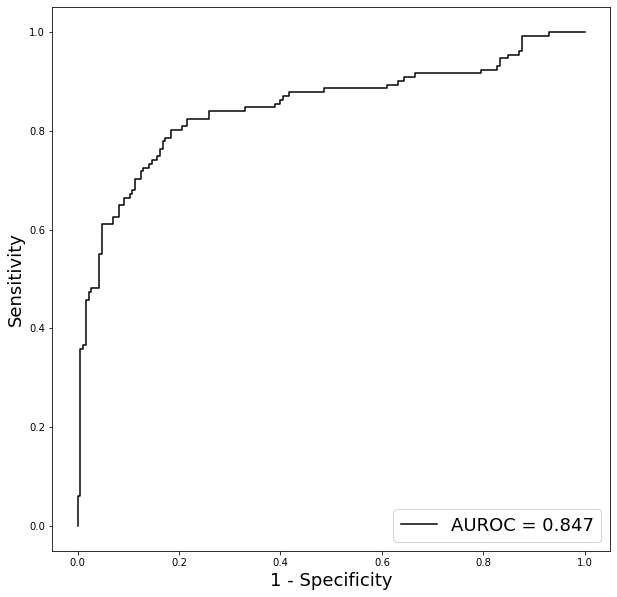

In [208]:
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np

df_T1_E_sag_all = df_T1_E_sag_all.astype({'target': float})
fpr1, tpr1, thresholds1 = metrics.roc_curve(df_T1_E_sag_all["target"],
                                         df_T1_E_sag_all["pred_T1_E_sag"])
best_thresh1 = thresholds1[np.argmax(tpr1 - fpr1)]
auc1 = metrics.auc(fpr1, tpr1)
plt.figure(figsize=(10, 10))
#plt.subplot(1, 2, 1)
plt.plot(fpr1, tpr1, label='AUROC = {auc:.03g}'.format(auc=auc1), color="black")
plt.xlabel('1 - Specificity', fontsize=18)
plt.ylabel('Sensitivity', fontsize=18)
plt.legend(fontsize=18, loc='lower right')

df_T1_E_sag_all["pred_class"] = (df_T1_E_sag_all["pred_T1_E_sag"]>=best_thresh1).astype(np.int16)
report = metrics.classification_report(df_T1_E_sag_all['target'],
                                      df_T1_E_sag_all['pred_class'],
                                      #target_names=CLASS_LABELS,
                                      output_dict=True)
df_report = pd.DataFrame(report)
display(df_report.T)
def specificity_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).flatten()
    return tn / (tn + fp)
print(f'specificity :{specificity_score(df_T1_E_sag_all["target"].values,df_T1_E_sag_all["pred_class"].values)}')

,precision,recall,f1-score,support
0.0,0.846154,0.880000,0.862745,100.000000
1.0,0.833333,0.789474,0.810811,76.000000
accuracy,0.840909,0.840909,0.840909,0.840909
macro avg,0.839744,0.834737,0.836778,176.000000
weighted avg,0.840618,0.840909,0.840319,176.000000


specificity :0.88


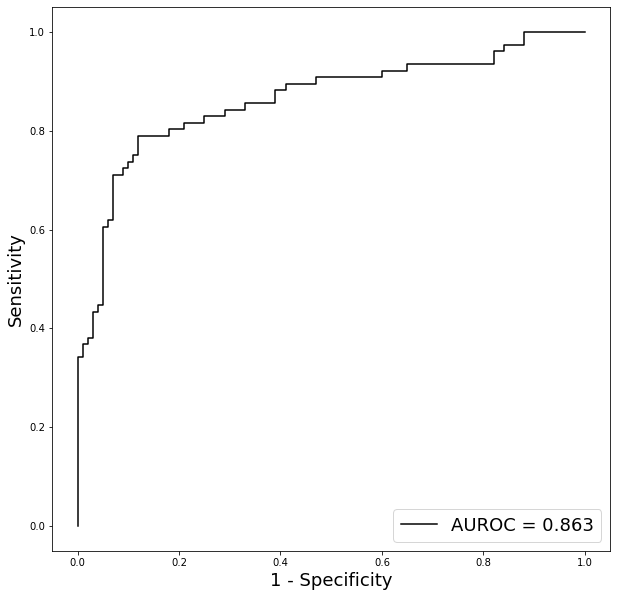

In [209]:
# Case Level
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np

df_result = df_T1_E_sag_all
df_result = df_result.groupby("id").mean()
#display(df_result)

fpr1, tpr1, thresholds1 = metrics.roc_curve(df_result["target"],
                                         df_result["pred_T1_E_sag"])
best_thresh1 = thresholds1[np.argmax(tpr1 - fpr1)]
auc1 = metrics.auc(fpr1, tpr1)
plt.figure(figsize=(10, 10))
#plt.subplot(1, 2, 1)
plt.plot(fpr1, tpr1, label='AUROC = {auc:.03g}'.format(auc=auc1), color="black")
plt.xlabel('1 - Specificity', fontsize=18)
plt.ylabel('Sensitivity', fontsize=18)
plt.legend(fontsize=18, loc='lower right')

df_result["pred_class"] = (df_result["pred_T1_E_sag"]>=best_thresh1).astype(np.int16)
report = metrics.classification_report(df_result['target'],
                                      df_result['pred_class'],
                                      #target_names=CLASS_LABELS,
                                      output_dict=True)
df_report = pd.DataFrame(report)
display(df_report.T)
def specificity_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).flatten()
    return tn / (tn + fp)
print(f'specificity :{specificity_score(df_result["target"].values,df_result["pred_class"].values)}')

In [188]:
import os

os.makedirs(f"{journal}_result", exist_ok=True)
os.makedirs(f"{journal}_result/Image_Level", exist_ok=True)
os.makedirs(f"{journal}_result/Case_Level", exist_ok=True)
if use_pb:
    if use_tn:
        save_dir = f"{journal}_result/Image_Level/{model_name}_TabNet_Concat_{str(auc1)[:5]}_csv_{csv_version}_image_{image_version}_T1_E_with_pb.csv"
    else:
        save_dir = f"{journal}_result/Image_Level/{model_name}_FC_{str(auc1)[:5]}_csv_{csv_version}_image_{image_version}_T1_E_with_pb.csv"
else:
    save_dir = f"{journal}_result/Image_Level/{model_name}_{str(auc1)[:5]}_csv_{csv_version}_image_{image_version}_T1_E_without_pb.csv"
df_T1_E_sag_all.to_csv(save_dir, index=True)

if use_pb:
    if use_tn:
        save_dir = f"{journal}_result/Case_Level/{model_name}_TabNet_Concat{str(auc1)[:5]}_csv_{csv_version}_image_{image_version}_T1_E_with_pb.csv"
    else:
        save_dir = f"{journal}_result/Case_Level/{model_name}_FC_{str(auc1)[:5]}_csv_{csv_version}_image_{image_version}_T1_E_with_pb.csv"
else:
    save_dir = f"{journal}_result/Case_Level/{model_name}_{str(auc1)[:5]}_csv_{csv_version}_image_{image_version}_T1_E_without_pb.csv"
df_result.to_csv(save_dir, index=True)

# Save T2sag + T1Esag DataFrame

,id,target_x,pred_T2sag,T2sag_path_x,f_code_x,T1_E_sag_path_x,kfold_x,pred_class_x,target_y,pred_T1_E_sag,T2sag_path_y,f_code_y,T1_E_sag_path_y,kfold_y,pred_class_y
0,7735029,0.0,0.046253,tumor_image_cropped_v2/train_image_cropped_v2\7735029_T2_sag10.jpg,handai,tumor_image_cropped_v2/train_image_cropped_v2\7735029_T1_E_sag10.jpg,0.0,0,0.0,0.079169,tumor_image_cropped_v2/train_image_cropped_v2\7735029_T2_sag10.jpg,handai,tumor_image_cropped_v2/train_image_cropped_v2\7735029_T1_E_sag10.jpg,0.0,0
1,7735029,0.0,0.046253,tumor_image_cropped_v2/train_image_cropped_v2\7735029_T2_sag10.jpg,handai,tumor_image_cropped_v2/train_image_cropped_v2\7735029_T1_E_sag10.jpg,0.0,0,0.0,0.121307,tumor_image_cropped_v2/train_image_cropped_v2\7735029_T2_sag11.jpg,handai,tumor_image_cropped_v2/train_image_cropped_v2\7735029_T1_E_sag11.jpg,0.0,0
2,7735029,0.0,0.061176,tumor_image_cropped_v2/train_image_cropped_v2\7735029_T2_sag11.jpg,handai,tumor_image_cropped_v2/train_image_cropped_v2\7735029_T1_E_sag11.jpg,0.0,0,0.0,0.079169,tumor_image_cropped_v2/train_image_cropped_v2\7735029_T2_sag10.jpg,handai,tumor_image_cropped_v2/train_image_cropped_v2\7735029_T1_E_sag10.jpg,0.0,0
3,7735029,0.0,0.061176,tumor_image_cropped_v2/train_image_cropped_v2\7735029_T2_sag11.jpg,handai,tumor_image_cropped_v2/train_image_cropped_v2\7735029_T1_E_sag11.jpg,0.0,0,0.0,0.121307,tumor_image_cropped_v2/train_image_cropped_v2\7735029_T2_sag11.jpg,handai,tumor_image_cropped_v2/train_image_cropped_v2\7735029_T1_E_sag11.jpg,0.0,0
4,7861988,0.0,0.031750,tumor_image_cropped_v2/train_image_cropped_v2\7861988_T2_sag5.jpg,handai,tumor_image_cropped_v2/train_image_cropped_v2\7861988_T1_E_sag5.jpg,0.0,0,0.0,0.234429,tumor_image_cropped_v2/train_image_cropped_v2\7861988_T2_sag5.jpg,handai,tumor_image_cropped_v2/train_image_cropped_v2\7861988_T1_E_sag5.jpg,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
574,B236,0.0,0.186404,tumor_image_cropped_v2/train_image_cropped_v2\B236_T2_sag2.jpg,B,tumor_image_cropped_v2/train_image_cropped_v2\B236_T1_E_sag2.jpg,4.0,0,0.0,0.137569,tumor_image_cropped_v2/train_image_cropped_v2\B236_T2_sag2.jpg,B,tumor_image_cropped_v2/train_image_cropped_v2\B236_T1_E_sag2.jpg,4.0,0
575,B236,0.0,0.186404,tumor_image_cropped_v2/train_image_cropped_v2\B236_T2_sag2.jpg,B,tumor_image_cropped_v2/train_image_cropped_v2\B236_T1_E_sag2.jpg,4.0,0,0.0,0.267054,tumor_image_cropped_v2/train_image_cropped_v2\B236_T2_sag3.jpg,B,tumor_image_cropped_v2/train_image_cropped_v2\B236_T1_E_sag3.jpg,4.0,0
576,B236,0.0,0.170278,tumor_image_cropped_v2/train_image_cropped_v2\B236_T2_sag3.jpg,B,tumor_image_cropped_v2/train_image_cropped_v2\B236_T1_E_sag3.jpg,4.0,0,0.0,0.226383,tumor_image_cropped_v2/train_image_cropped_v2\B236_T2_sag1.jpg,B,tumor_image_cropped_v2/train_image_cropped_v2\B236_T1_E_sag1.jpg,4.0,0
577,B236,0.0,0.170278,tumor_image_cropped_v2/train_image_cropped_v2\B236_T2_sag3.jpg,B,tumor_image_cropped_v2/train_image_cropped_v2\B236_T1_E_sag3.jpg,4.0,0,0.0,0.137569,tumor_image_cropped_v2/train_image_cropped_v2\B236_T2_sag2.jpg,B,tumor_image_cropped_v2/train_image_cropped_v2\B236_T1_E_sag2.jpg,4.0,0


,target_x,pred_T2sag,kfold_x,pred_class_x,target_y,pred_T1_E_sag,kfold_y,pred_class_y
id,,,,,,,,
10024438,0.0,0.005045,2.0,0.0,0.0,0.081281,2.0,0.0
10059878,0.0,0.084722,1.0,0.0,0.0,0.340753,1.0,0.5
10118042,0.0,0.181811,4.0,0.0,0.0,0.116207,4.0,0.0
10121921,1.0,0.899707,2.0,1.0,1.0,0.481839,2.0,1.0
10175876,1.0,0.179868,4.0,0.0,1.0,0.101279,4.0,0.0
...,...,...,...,...,...,...,...,...
W010,1.0,0.080529,2.0,0.0,1.0,0.249863,2.0,0.0
W012,0.0,0.001697,1.0,0.0,0.0,0.094469,1.0,0.0
W013,0.0,0.008759,2.0,0.0,0.0,0.019610,2.0,0.0


,precision,recall,f1-score,support
0.0,0.900990,0.827273,0.862559,110.000000
1.0,0.683333,0.803922,0.738739,51.000000
accuracy,0.819876,0.819876,0.819876,0.819876
macro avg,0.792162,0.815597,0.800649,161.000000
weighted avg,0.832043,0.819876,0.823337,161.000000


specificity :0.8272727272727273


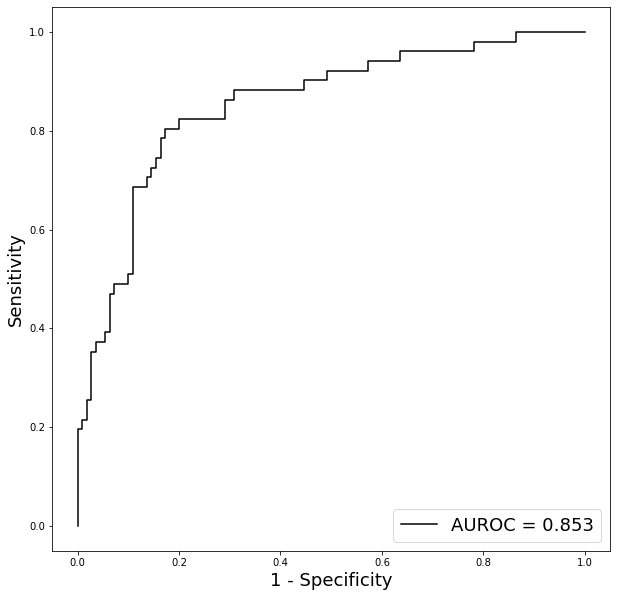

In [13]:
import os

df_test = pd.merge(df_T2sag_all, df_T1_E_sag_all, on="id", how="outer")
display(df_test)

df_result = df_test.groupby("id").mean()
df_result.fillna("none", inplace=True)
#df_result["pred_T1_E_sag"] = df_result["pred_T1_E_sag"].astype(float)
display(df_result)
#print(df.isnull().sum())
preds = []
targets = []
for i, row in enumerate(df_result.iterrows()):
  tx = row[1]["target_x"]
  ty = row[1]["target_y"]
  pred_T2sag = row[1]["pred_T2sag"]
  pred_T1_E_sag = row[1]["pred_T1_E_sag"]
  if pred_T2sag=="none":
    pred_T2sag = pred_T1_E_sag
    tx=ty
  if pred_T1_E_sag=="none":
    pred_T1_E_sag=pred_T2sag

  pred = (pred_T2sag + pred_T1_E_sag)/2
  preds.append(pred)
  targets.append(tx)

df_result["target"] = targets
df_result["pred"] = preds
#display(df_result)
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np

fpr1, tpr1, thresholds1 = metrics.roc_curve(df_result["target"],
                                         df_result['pred'])
best_thresh1 = thresholds1[np.argmax(tpr1 - fpr1)]
auc1 = metrics.auc(fpr1, tpr1)
plt.figure(figsize=(10, 10))
#plt.subplot(1, 2, 1)
plt.plot(fpr1, tpr1, label='AUROC = {auc:.03g}'.format(auc=auc1), color="black")
plt.xlabel('1 - Specificity', fontsize=18)
plt.ylabel('Sensitivity', fontsize=18)
plt.legend(fontsize=18, loc='lower right')

df_result["pred_class"] = (df_result["pred"]>=best_thresh1).astype(np.int16)
report = metrics.classification_report(df_result['target'],
                                      df_result['pred_class'],
                                      #target_names=CLASS_LABELS,
                                      output_dict=True)
df_report = pd.DataFrame(report)
display(df_report.T)
def specificity_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).flatten()
    return tn / (tn + fp)
print(f'specificity :{specificity_score(df_result["target"].values,df_result["pred_class"].values)}')

save_dir = f"result"
os.makedirs(save_dir, exist_ok=True)
save_dir = f"result/T2sag_T1_E_sag"
os.makedirs(save_dir, exist_ok=True)
save_dir = f"result/T2sag_T1_E_sag/csv_{csv_version}_image{image_version}"
os.makedirs(save_dir, exist_ok=True)
save_dir = save_dir + f"/{now}_{model_name}_{auc1}.csv"
df_test.to_csv(save_dir, index=False)

# T1sag Train

In [ ]:
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch
from sklearn.model_selection import train_test_split, StratifiedKFold
import datetime
import pytz
from pytorch_lightning.loggers import CSVLogger
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint
import os
from glob import glob
import numpy as np
from tqdm import tqdm

!nvidia-smi

DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(DEVICE)
save_model=False
#df_train_val = df_train_val_sag

epochs = 120#3 #120
bs = 49
models = []
train_ns = []
df_T1sag_all = pd.DataFrame(columns=["id", "target", "pred_T1sag"])
#df_axi_all = pd.DataFrame(columns=["id", "target", "pred_axi"])
#now = str(datetime.datetime.now(pytz.timezone('Asia/Tokyo')))[:-16]

for i in range(kfold):
  print("###############################################################################################")
  print(f"{i+1}th Fold starting")
  print("###############################################################################################")
  df_cycle = df_sag
  df_train_val = df_cycle[df_cycle["kfold"]!=i].reset_index(drop=True)
  df_test = df_cycle[df_cycle["kfold"]==i].reset_index(drop=True)
  #mode = df_train_val["path"].values[0].split("_")[-1][:3]#"sag" or "axi"
  now = str(datetime.datetime.now(pytz.timezone('Asia/Tokyo')))[:-16]
  ids = list(set(df_train_val["id"].values))
  n = len(df_train_val)
  id2fold = {}
  for m, id in enumerate(ids):
    id2fold[id] = m%(kfold)

  df_train_val["kfold"] = df_train_val["id"].map(id2fold)
  for i_iter in range(kfold):
    #print(f"{i_iter+1}th Fold starting")
    df_train = df_train_val[df_train_val["kfold"]!=i_iter].reset_index(drop=True)
    if len(df_train)%bs==1:
      df_train = df_train[:-1]
    df_val = df_train_val[df_train_val["kfold"]==i_iter].reset_index(drop=True)
    if len(df_val)%bs==1:
      df_val = df_val[:-1]
    train_ns.append(len(df_train))
    train_set = Spine(df=df_train, path_col="T1sag_path")
    train_loader = DataLoader(
        train_set,
        batch_size=bs,
        shuffle=True,
        num_workers=2,
        pin_memory=True
    )
    val_set = Spine(df=df_val, is_train=False, path_col="T1sag_path")
    val_loader = DataLoader(
        val_set,
        batch_size=bs,
        shuffle=False,
        num_workers=2,
        pin_memory=True,
        #drop_last = True
    )

    net = LitNet()
    early_stop_callback = EarlyStopping(monitor="val_acc",
                                      patience=4,
                                      verbose=True,
                                      mode='max')
    if save_model:
      save_dir = f"/content/drive/MyDrive/Spinal_Tumor/saved_model/{model_name}_{now}"
      os.makedirs(save_dir, exist_ok=True)
      save_dir = f"/content/drive/MyDrive/Spinal_Tumor/saved_model/{model_name}_{now}/{i_iter}"
      os.makedirs(save_dir, exist_ok=True)
    else:
      save_dir = f"my/path_{now}"
      os.makedirs(save_dir, exist_ok=True)
      save_dir = f"my/path_{now}/{i_iter}"
    loss_checkpoint_callback = ModelCheckpoint(
      monitor="val_loss",
      dirpath=save_dir,
      filename="Spine_Tumor-{epoch:02d}-{val_loss:.3f}",
      save_top_k=1,
      save_weights_only=True,
      mode="min")
    acc_checkpoint_callback = ModelCheckpoint(
      monitor="val_acc",
      dirpath=save_dir,
      filename="Spine_Tumor-{epoch:02d}-{val_acc:.3f}",
      save_top_k=1,
      save_weights_only=True,
      mode="max")
    logger = CSVLogger(save_dir="logs", name=f'{now}_{i_iter}_my_exp')
    trainer = pl.Trainer(gpus=1 if torch.cuda.is_available() else 0,
                          max_epochs=epochs,
                          logger=logger,
                          log_every_n_steps=len(train_loader),
                        callbacks=[loss_checkpoint_callback, acc_checkpoint_callback])
                          #callbacks=[early_stop_callback, checkpoint_callback])
    trainer.fit(net, train_loader, val_loader)
    #best_model = net.model
    #models.append(best_model)
    #print(f"{i_iter+1}th Fold finishing")

  #print("finish training")

  ################################################################
  #Prediction Pahse
  paths_loss = glob(f"/content/my/path_{now}/*/*val_loss*.ckpt")
  paths_acc = glob(f"/content/my/path_{now}/*/*val_acc*.ckpt")

  model0 = LitNet.load_from_checkpoint(paths_loss[0])
  model1 = LitNet.load_from_checkpoint(paths_loss[1])
  model2 = LitNet.load_from_checkpoint(paths_loss[2])
  model3 = LitNet.load_from_checkpoint(paths_acc[0])
  model4 = LitNet.load_from_checkpoint(paths_acc[1])
  model5 = LitNet.load_from_checkpoint(paths_acc[2])

  models = []
  models.append(model0); models.append(model1); models.append(model2); models.append(model3); models.append(model4); models.append(model5)
  bs = 40
  test_set = Spine(df=df_test, is_train=False, path_col="T1sag_path")
  test_loader = DataLoader(
      test_set,
      batch_size=bs,
      shuffle=False,
      num_workers=1,
      pin_memory=True,
      #drop_last = True
  )

  #ys = np.zeros((0, bs))
  for k, batch in enumerate(tqdm(test_loader)):
    x, t = batch
    #print(torch.sigmoid(model0(x)))
    #break
    y_pred = 0
    #y_row = []
    for model in models:
      #model = LitNet.load_from_checkpoint(path)
      y_preds = torch.sigmoid(model(x)).detach().numpy()
      y_pred += y_preds/(len(models))
    #ys.append(y_pred)
    if k==0:
      ys = y_pred.T
    else:
      ys = np.hstack([ys, y_pred.T])

  df_test["pred_T1sag"] = ys.flatten()
  df_T1sag_all = pd.concat([df_T1sag_all, df_test]).reset_index(drop=True)
  #print(ys)
  """
  if mode=="sag":
    df_test["pred_sag"] = ys.flatten()
    df_sag_all = pd.concat([df_sag_all, df_test]).reset_index(drop=True)
  elif mode=="axi":
    df_test["pred_axi"] = ys.flatten()
    df_axi_all = pd.concat([df_axi_all, df_test]).reset_index(drop=True)
  """
  print("###############################################################################################")
  print(f"{i+1}th Fold finishing")
  print("###############################################################################################")

display(df_T1sag_all)
#display(df_axi_all)

# T1sag AUROC

In [ ]:
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np

fpr1, tpr1, thresholds1 = metrics.roc_curve(df_T1sag_all["target"],
                                         df_T1sag_all["pred_T1sag"])
best_thresh1 = thresholds1[np.argmax(tpr1 - fpr1)]
auc1 = metrics.auc(fpr1, tpr1)
plt.figure(figsize=(10, 10))
#plt.subplot(1, 2, 1)
plt.plot(fpr1, tpr1, label='AUROC = {auc:.03g}'.format(auc=auc1), color="black")
plt.xlabel('1 - Specificity', fontsize=18)
plt.ylabel('Sensitivity', fontsize=18)
plt.legend(fontsize=18, loc='lower right')

df_T1sag_all["pred_class"] = (df_T1sag_all["pred_T1sag"]>=best_thresh1).astype(np.int16)
report = metrics.classification_report(df_T1sag_all['target'],
                                      df_T1sag_all['pred_class'],
                                      #target_names=CLASS_LABELS,
                                      output_dict=True)
df_report = pd.DataFrame(report)
display(df_report.T)
def specificity_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).flatten()
    return tn / (tn + fp)
print(f'specificity :{specificity_score(df_T1sag_all["target"].values,df_T1sag_all["pred_class"].values)}')

In [ ]:
import os

df_test = pd.merge(df_sag_all, df_axi_all, on="id", how="outer")
display(df_test)

df_result = df_test.groupby("id").mean()
df_result.fillna("none", inplace=True)
#df_result["pred_axi"] = df_result["pred_axi"].astype(float)
display(df_result)
#print(df.isnull().sum())
preds = []
targets = []
for i, row in enumerate(df_result.iterrows()):
  tx = row[1]["target_x"]
  ty = row[1]["target_y"]
  pred_sag = row[1]["pred_sag"]
  pred_axi = row[1]["pred_axi"]
  if pred_sag=="none":
    pred_sag = pred_axi
    tx=ty
  if pred_axi=="none":
    pred_axi=pred_sag

  pred = (pred_sag + pred_axi)/2
  preds.append(pred)
  targets.append(tx)

df_result["target"] = targets
df_result["pred"] = preds
#display(df_result)
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np

fpr1, tpr1, thresholds1 = metrics.roc_curve(df_result["target"],
                                         df_result['pred'])
best_thresh1 = thresholds1[np.argmax(tpr1 - fpr1)]
auc1 = metrics.auc(fpr1, tpr1)
plt.figure(figsize=(10, 10))
#plt.subplot(1, 2, 1)
plt.plot(fpr1, tpr1, label='AUROC = {auc:.03g}'.format(auc=auc1), color="black")
plt.xlabel('1 - Specificity', fontsize=18)
plt.ylabel('Sensitivity', fontsize=18)
plt.legend(fontsize=18, loc='lower right')

df_result["pred_class"] = (df_result["pred"]>=best_thresh1).astype(np.int16)
report = metrics.classification_report(df_result['target'],
                                      df_result['pred_class'],
                                      #target_names=CLASS_LABELS,
                                      output_dict=True)
df_report = pd.DataFrame(report)
display(df_report.T)
def specificity_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).flatten()
    return tn / (tn + fp)
print(f'specificity :{specificity_score(df_result["target"].values,df_result["pred_class"].values)}')

save_dir = f"/content/drive/MyDrive/Spinal_Tumor/cnn_result_{version}"
os.makedirs(save_dir, exist_ok=True)
save_dir = save_dir + f"/{now}_{model_name}_{auc1}.csv"
df_test.to_csv(save_dir, index=False)

In [ ]:
print(train_ns)

In [ ]:

len(df_val)%bs

# Visualize Log

In [ ]:
import matplotlib.pyplot as plt
#0.113, 0.111, 0.078
monitor = "acc"
monitor2 = "loss"
plt.figure(figsize=(28, 8))
#fig, axes = plt.subplots(1, 3)
for i in range(kfold):
  #plt.subplot(1, kfold, i+1)
  ax1 = plt.subplot(1, kfold, i+1)
  path = f"/content/logs/{now}_{i}_my_exp/version_0/metrics.csv"
  log = pd.read_csv(path)
  log = log[[f'val_{monitor2}', f'val_{monitor}', 'epoch']].dropna(how='any', axis=0).reset_index()
  ax1.plot(log["epoch"], log[f'val_{monitor}'], label=f'val_{monitor}')
  #plt.legend()
  ax2 = ax1.twinx() 
  ax2.plot(log["epoch"], log[f'val_{monitor2}'], label=f'val_{monitor2}', color="orange")
  plt.legend()
  #log.plot(x=log["epoch"], y=log[f'val_{monitor}'], secondary_y=log[f'val_{monitor2}'])
  #log[[f'train_{monitor}', 'epoch']].dropna(how='any', axis=0).reset_index()[f'train_{monitor}'].plot(legend=True, title=f"{i+1}Fold's {monitor}");
  #log[[f'val_{monitor}', 'epoch']].dropna(how='any', axis=0).reset_index()[f'val_{monitor}'].plot(legend=True, title=f"{i+1}Fold's")# {monitor}");
  #log[[f'val_{monitor2}', 'epoch']].dropna(how='any', axis=0).reset_index()[f'val_{monitor2}'].plot(legend=True, title=f"{i+1}Fold's")# {monitor2}");

# Predict on Test Dataset

In [ ]:
from glob import glob

paths = glob("/content/my/path_2022-05-20 13:29/*/*val_loss*.ckpt")
#paths = glob("/content/my/path_2022-05-19 15:48/*/*val_acc*.ckpt")

model0 = LitNet.load_from_checkpoint(paths[0])
model1 = LitNet.load_from_checkpoint(paths[1])
model2 = LitNet.load_from_checkpoint(paths[2])

models = []
models.append(model0); models.append(model1); models.append(model2)

In [ ]:
# Sagittal

from glob import glob
import numpy as np
from tqdm import tqdm

#df_test = df_test_sag
#paths = glob("/content/my/path_2022-05-19 11:58/*/*val_loss*.ckpt")
bs = 24
test_set = Spine(df=df_test_sag, is_train=False)
test_loader = DataLoader(
    test_set,
    batch_size=bs,
    shuffle=False,
    num_workers=1,
    pin_memory=True,
    #drop_last = True
)

#ys = np.zeros((0, bs))
for i, batch in enumerate(tqdm(test_loader)):
  x, t = batch
  #print(torch.sigmoid(model0(x)))
  #break
  y_pred = 0
  #y_row = []
  for model in models:
    #model = LitNet.load_from_checkpoint(path)
    y_preds = torch.sigmoid(model(x)).detach().numpy()
    y_pred += y_preds/(len(models))
  #ys.append(y_pred)
  if i==0:
    ys = y_pred.T
  else:
    ys = np.hstack([ys, y_pred.T])

#print(ys)
df_test_sag["pred_sag"] = ys.flatten()
display(df_test_sag)

In [ ]:
# Axial

from glob import glob
import numpy as np
from tqdm import tqdm

#df_test = df_test_axi
#paths = glob("/content/my/path_2022-05-19 11:58/*/*val_loss*.ckpt")
bs = 24
test_set = Spine(df=df_test_axi, is_train=False)
test_loader = DataLoader(
    test_set,
    batch_size=bs,
    shuffle=False,
    num_workers=1,
    pin_memory=True,
    #drop_last = True
)

#ys = np.zeros((0, bs))
for i, batch in enumerate(tqdm(test_loader)):
  x, t = batch
  #print(torch.sigmoid(model0(x)))
  #break
  y_pred = 0
  #y_row = []
  for model in models:
    #model = LitNet.load_from_checkpoint(path)
    y_preds = torch.sigmoid(model(x)).detach().numpy()
    y_pred += y_preds/(len(models))
  #ys.append(y_pred)
  if i==0:
    ys = y_pred.T
  else:
    ys = np.hstack([ys, y_pred.T])

#print(ys)
df_test_axi["pred_axi"] = ys.flatten()
display(df_test_axi)

In [ ]:
df_test = pd.merge(df_test_sag, df_test_axi, on="id", how="outer")
display(df_test)

# AUROC

In [ ]:
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np

fpr1, tpr1, thresholds1 = metrics.roc_curve(df_test["target"],
                                         df_test['pred'])
best_thresh1 = thresholds1[np.argmax(tpr1 - fpr1)]
auc1 = metrics.auc(fpr1, tpr1)
plt.figure(figsize=(10, 10))
#plt.subplot(1, 2, 1)
plt.plot(fpr1, tpr1, label='AUROC = {auc:.03g}'.format(auc=auc1), color="black")
plt.xlabel('1 - Specificity', fontsize=18)
plt.ylabel('Sensitivity', fontsize=18)
plt.legend(fontsize=18, loc='lower right')

df_test["pred_class"] = (df_test["pred"]>=best_thresh1).astype(np.int16)
report = metrics.classification_report(df_test['target'],
                                      df_test['pred_class'],
                                      #target_names=CLASS_LABELS,
                                      output_dict=True)
df_report = pd.DataFrame(report)
display(df_report.T)
def specificity_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).flatten()
    return tn / (tn + fp)
print(f'specificity :{specificity_score(df_test["target"].values,df_test["pred_class"].values)}')

In [ ]:
print(ys.flatten().shape)
df_test_sag["pred"] = ys.flatten()
display(df_test_sag)

In [2]:
import pytorch_lightning

pytorch_lightning.__version__

C:\Users\kita\anaconda3\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


'1.7.0dev'

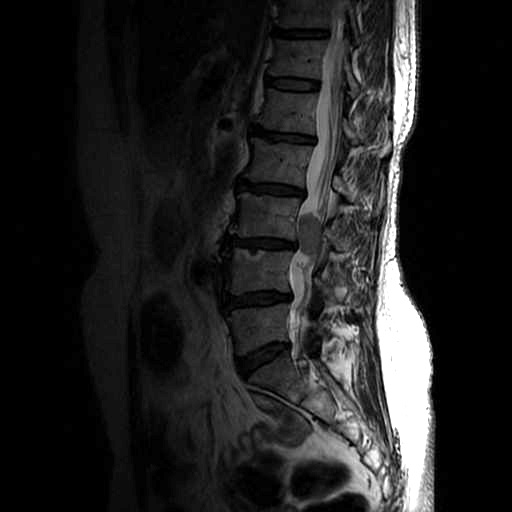

In [16]:
import cv2
import numpy as np
from IPython.display import Image, display
import matplotlib.pyplot as plt

def imshow(img):
    """ndarray 配列をインラインで Notebook 上に表示する。
    """
    ret, encoded = cv2.imencode(".jpg", img)
    display(Image(encoded, width=1500, height=1500))

def adjust(img, alpha=1.8, beta=0.0):
    # 積和演算を行う。
    dst = alpha * img + beta
    # [0, 255] でクリップし、uint8 型にする。
    return np.clip(dst, 0, 255).astype(np.uint8)


img = cv2.imread("11825851_T2_sag7.jpg")

dst = adjust(img, alpha=3.0, beta=0)
imshow(dst)
#plt.figure(figsize=(20, 20))
#plt.imshow(img)
#plt.axis("off")